In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import rcParams
from mpl_toolkits.mplot3d import Axes3D
import torch.nn as nn
import torch.nn.functional as F
import torch
from ctgan import CTGAN
from ctgan import TVAE
# import xgboost as xgb
import qsi
from qsi import io
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score,mean_absolute_error,confusion_matrix,f1_score
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.svm import SVR,SVC
from xgboost import XGBRFRegressor,XGBClassifier
from lightgbm import LGBMClassifier,LGBMRegressor

import warnings
warnings.filterwarnings("ignore")

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus']=False

## Raman Spectra for Radix Bupleuri Samples from Different Origins and Varieties

In [ ]:
data1=pd.read_excel("data\Raman datasets(different region).xlsx")
data1=pd.concat([data1.iloc[:,100:1600],data1.iloc[:,-1]],axis=1)
data2=pd.read_excel("data\Raman datasets(black vs. others).xlsx")
data2=pd.concat([data2.iloc[:,100:1600],data2.iloc[:,-1]],axis=1)
data3=pd.read_excel("data\Raman datasets(wild vs cultivated).xlsx")
data3=pd.concat([data3.iloc[:,100:1600],data3.iloc[:,-1]],axis=1)

In [ ]:
y1=np.array(np.array(data2[data2['type']==1].iloc[:,:-1].mean()))
y2=np.array(np.array(data2[data2['type']==0].iloc[:,:-1].mean()))
y2=[i+800 for i in y2]
x1=np.linspace(241,3132,1500)
x2=np.linspace(341,3232,1500)

In [ ]:
font = {'family': 'Times New Roman','size': 22}
plt.rcParams['figure.dpi']=500
plt.rcParams['figure.figsize']=(10,10)
mpl.rcParams['font.family']='Times New Roman'
mpl.rcParams['axes.unicode_minus']=False

plt.plot(x1,y1,c='r',label='Black')
plt.plot(x2,y2,c='g',label='Others')
plt.legend()

plt.legend(loc="upper left",prop=font)
plt.xticks(family='Times New Roman')
plt.yticks(family='Times New Roman')
plt.xlabel('Raman Shift (cm$^{-1}$)',size=24)
plt.ylabel('Relative Intensity (a.u.)',size=24)
plt.tick_params(labelsize=24)
plt.rc('font',family='Times New Roman')
plt.text(3250,6000,'(a)',family='Times New Roman',size=24)

In [ ]:
y1=np.array(np.array(data3[data3['type']==0].iloc[:,:-1].mean()))
y2=np.array(np.array(data3[data3['type']==1].iloc[:,:-1].mean()))
y2=[i+800 for i in y2]
x1=np.linspace(241,3132,1500)
x2=np.linspace(341,3232,1500)
plt.plot(x1,y1,c='r',label='Wild')
plt.plot(x2,y2,c='g',label='Cultivated')
plt.legend()
plt.legend(loc="upper left",prop=font)
plt.xticks(family='Times New Roman')
plt.yticks(family='Times New Roman')
plt.xlabel('Raman Shift (cm$^{-1}$)')
plt.ylabel('Relative Intensity (a.u.)')
plt.rc('font',family='Times New Roman')
plt.text(3250,4500,'(a)',family='Times New Roman')

In [ ]:
y1=np.array(data1[data1['type']==1].iloc[:,:-1].mean())
y2=np.array(data1[data1['type']==2].iloc[:,:-1].mean())
y3=np.array(data1[data1['type']==0].iloc[:,:-1].mean())
y2=[i+700 for i in y2]
y3=[i+1400 for i in y3]
x1=np.linspace(241,3132,1500)
x2=np.linspace(311,3202,1500)
x3=np.linspace(381,3272,1500)
plt.plot(x1,y1,c='orange',label='Gansu')
plt.plot(x2,y2,c='g',label='Shaanxi')
plt.plot(x3,y3,c='black',label='Inner Mongolia')
plt.legend()
plt.legend(loc="upper left",prop=font)
plt.xticks(family='Times New Roman')
plt.yticks(family='Times New Roman')
plt.xlabel('Raman Shift (cm$^{-1}$)')
plt.ylabel('Relative Intensity (a.u.)')
plt.rc('font',family='Times New Roman')
plt.text(3300,6000,'(a)',family='Times New Roman')

In [7]:
def fit_ctgan(train_x,train_y,test_x,test_y,epoch,discrete_columns=None):
    train_set=pd.concat([pd.DataFrame(train_x),pd.DataFrame(train_y)],axis=1)
    test_set=pd.concat([pd.DataFrame(test_x),pd.DataFrame(test_y)],axis=1)
    discrete_columns=[discrete_columns]
    ctgan = CTGAN()
    ctgan.fit(train_set, discrete_columns,epochs=epoch)
    return ctgan

def generate_data(model,train_x,train_y,test_x,test_y,generate_sam):
    train_set=pd.concat([pd.DataFrame(train_x),pd.DataFrame(train_y)],axis=1)
    test_set=pd.concat([pd.DataFrame(test_x),pd.DataFrame(test_y)],axis=1)
    synthetic_data = model.sample(generate_sam)
    data_all=pd.concat([synthetic_data,train_set],axis=0)
    train_x=data_all.iloc[:,:-1]
    train_y=data_all.iloc[:,-1]
    test_x=test_set.iloc[:,:-1]
    test_y=test_set.iloc[:,-1]
    return train_x,train_y,test_x,test_y

def trandform_data_lda(train_x,train_y,test_x,test_y,lda_dim):
    s=StandardScaler()
    lda=LDA(n_components=lda_dim)
    if train_y.name!='type':
        train_for_y=train_x.iloc[:,-1]
        test_for_y=test_x.iloc[:,-1]
        train_x=train_x.iloc[:,:-1]
        test_x=test_x.iloc[:,:-1]
        s.fit(pd.concat([train_x,test_x],axis=0))
        train_x=pd.DataFrame(s.transform(train_x),columns=train_x.columns)
        test_x=pd.DataFrame(s.transform(test_x),columns=test_x.columns)
        lda.fit(pd.concat([train_x,test_x],axis=0),pd.concat([train_for_y,test_for_y],axis=0))
    else:
        s.fit(pd.concat([train_x,test_x],axis=0))
        train_x=pd.DataFrame(s.transform(train_x),columns=train_x.columns)
        test_x=pd.DataFrame(s.transform(test_x),columns=test_x.columns)
        lda.fit(pd.concat([train_x,test_x],axis=0),pd.concat([train_y,test_y],axis=0))
    train_x=lda.transform(train_x)
    train_x=pd.DataFrame(train_x)
    test_x=lda.transform(test_x)
    test_x=pd.DataFrame(test_x)
    return train_x,train_y,test_x,test_y

def trandform_data_pca(train_x,train_y,test_x,test_y):
    s=StandardScaler()
    s.fit(pd.concat([train_x,test_x],axis=0))
    train_x=pd.DataFrame(s.transform(train_x))
    test_x=pd.DataFrame(s.transform(test_x))
    pca=PCA(n_components=2)
    pca.fit(pd.concat([train_x,test_x],axis=0))
    train_x=pca.transform(train_x)
    train_x=pd.DataFrame(train_x)
    test_x=pca.transform(test_x)
    test_x=pd.DataFrame(test_x)
    return train_x,train_y,test_x,test_y

def plot_pic(train_x,train_y,test_x,test_y,label,n_class=None,model='lda'):
    data=pd.concat([pd.concat([train_x,train_y.reset_index(drop=True)],axis=1),pd.concat([test_x,test_y.reset_index(drop=True)],axis=1)],axis=0)
    data.reset_index(drop=True)
    font = {'family': 'Times New Roman','size': 22}
    plt.rcParams['figure.dpi']=500
    plt.figure(figsize=(10,10))
    color=['r','g','b']
    if n_class==3:
        for i in range(3):
            df=data[data['type']==i].iloc[:,:-1]
            plt.scatter(df.iloc[:,0],df.iloc[:,1],color=color[i],label=label[i])
            plt.xlabel('Component 1',family='Times New Roman',size=24)
            plt.ylabel('Component 2',family='Times New Roman',size=24)
    elif n_class==2 and model=='lda':
        for i in range(2):
            df=data[data['type']==i]
            plt.scatter(df.iloc[:,1],df.iloc[:,0],color=color[i],label=label[i])
            plt.xlabel('Reference Class',family='Times New Roman',size=24)
            plt.ylabel('Component',family='Times New Roman',size=24)
    elif n_class==2 and model=='pca':
        for i in range(2):
            df=data[data['type']==i].iloc[:,:-1]
            plt.scatter(df.iloc[:,0],df.iloc[:,1],color=color[i],label=label[i])
            plt.xlabel('Component 1',family='Times New Roman',size=24)
            plt.ylabel('Component 2',family='Times New Roman',size=24)
    plt.legend()
    # plt.ylim(-40,84)
    plt.legend(loc="upper left",prop=font)
    plt.xticks(family='Times New Roman',size=24)
    plt.yticks(family='Times New Roman',size=24)
    plt.show()

def train_svm(train_x,train_y,test_x,test_y,C,kernel,task,regression_label=None,poisition=None):
    print(C,kernel)
    if task=='classification':
        model=SVC(C=C,kernel=kernel)
        model.fit(train_x,train_y)
        ## train_set
        print('train_set')
        predict=model.predict(train_x)
        a=np.sum(train_y==predict)
        print('ACC:',a/len(train_y))
        C=confusion_matrix(predict,train_y)
        print(C)
        print('F1:',f1_score(train_y,predict,average=None))
        
        ## test_set
        print('test_set')
        predict=model.predict(test_x)
        a=np.sum(test_y==predict)
        print('ACC:',a/len(test_y))
        C=confusion_matrix(predict,test_y)
        print(C)
        print('F1:',f1_score(test_y,predict,average=None))
    elif task=='regression':
        model=SVR(C=C,kernel=kernel)
        model.fit(train_x,train_y)
        predict=model.predict(test_x)
        print('r2:',r2_score(test_y,predict))
        print('mse:',mean_absolute_error(test_y,predict))
        
        plt.rcParams['figure.dpi']=500
        plt.rcParams['figure.figsize']=(10,10)
        plt.figure()
        a=np.arange(0,len(test_y),1)
        plt.plot(a,test_y,c='r',label='real',linestyle='dotted')
        plt.plot(a,predict,c='g',label='predict')
        plt.scatter(a,test_y)
        plt.scatter(a,predict)
        plt.legend()
        plt.xlabel('samples',fontsize=24,family='Times New Roman')
        plt.ylabel(regression_label+' (mg/L)',fontsize=24,family='Times New Roman')
        font = {'family': 'Times New Roman','size': 22}
        plt.legend(loc="upper left",prop=font)
        plt.tick_params(labelsize=24)
        plt.xticks(family='Times New Roman')
        plt.yticks(family='Times New Roman')
        plt.text(0.98*max(a),max(max(predict),max(test_y)),poisition,family='Times New Roman',size=24)
        plt.show()
    
def train_xgb(train_x,train_y,test_x,test_y,learning_rate=0.1,reg_alpha=0.1,reg_lambda=0.1,max_depth=6,task='classification',regression_label=None,poisition=None):
#     print(C,kernel)
    if task=='classification':
        model= XGBClassifier(learning_rate=learning_rate,reg_alpha=reg_alpha,reg_lambda=reg_lambda,max_depth=max_depth)
        model.fit(train_x,train_y)
        ## train_set
        print('train_set')
        predict=model.predict(train_x)
        a=np.sum(train_y==predict)
        print('ACC:',a/len(train_y))
        C=confusion_matrix(predict,train_y)
        print(C)
        print('F1:',f1_score(train_y,predict,average=None))
        
        ## test_set
        print('test_set')
        predict=model.predict(test_x)
        a=np.sum(test_y==predict)
        print('ACC:',a/len(test_y))
        C=confusion_matrix(predict,test_y)
        print(C)
        print('F1:',f1_score(test_y,predict,average=None))
    elif task=='regression':
        model=XGBRFRegressor(learning_rate=learning_rate,reg_alpha=reg_alpha,reg_lambda=reg_lambda,max_depth=max_depth)
        model.fit(train_x,train_y)
        predict=model.predict(test_x)
        print('r2:',r2_score(test_y,predict))
        print('mse:',mean_absolute_error(test_y,predict))
        
        plt.figure()
        plt.rcParams['figure.dpi']=500
        plt.rcParams['figure.figsize']=(10,10)
        a=np.arange(0,len(test_y),1)
        plt.plot(a,test_y,c='r',label='real',linestyle='dotted')
        plt.plot(a,predict,c='g',label='predict')
        plt.scatter(a,test_y)
        plt.scatter(a,predict)
        plt.legend()
        plt.xlabel('samples',fontsize=24,family='Times New Roman')
        plt.ylabel(regression_label+' (mg/L)',fontsize=24,family='Times New Roman')
        font = {'family': 'Times New Roman','size': 22}
        plt.legend(loc="upper left",prop=font)
        plt.tick_params(labelsize=24)
        plt.xticks(family='Times New Roman')
        plt.yticks(family='Times New Roman')
        plt.text(0.98*max(a),max(max(predict),max(test_y)),poisition,family='Times New Roman',size=24)
        plt.show()
    
def train_lgb(train_x,train_y,test_x,test_y,boosting_type='gbdt',learning_rate=0.1,max_depth=6,lambda_l1=0.1,lambda_l2=0.1,task='classification',regression_label=None,poisition=None):
    if task=='classification':
        model= LGBMClassifier(boosting_type=boosting_type,learning_rate=learning_rate,max_depth=max_depth,lambda_l1=lambda_l1,lambda_l2=lambda_l2,force_row_wise=True,verbose= -1)
        model.fit(train_x,train_y)
        ## train_set
        print('train_set')
        predict=model.predict(train_x)
        a=np.sum(train_y==predict)
        print('ACC:',a/len(train_y))
        C=confusion_matrix(predict,train_y)
        print(C)
        print('F1:',f1_score(train_y,predict,average=None))
        
        ## test_set
        print('test_set')
        predict=model.predict(test_x)
        a=np.sum(test_y==predict)
        print('ACC:',a/len(test_y))
        C=confusion_matrix(predict,test_y)
        print(C)
        print('F1:',f1_score(test_y,predict,average=None))
    elif task=='regression':
        model=LGBMRegressor(boosting_type=boosting_type,learning_rate=learning_rate,max_depth=max_depth,lambda_l1=lambda_l1,lambda_l2=lambda_l2,force_row_wise=True,verbose= -1)
        model.fit(train_x,train_y)
        predict=model.predict(test_x)
        print('r2:',r2_score(test_y,predict))
        print('mse:',mean_absolute_error(test_y,predict))
        
        plt.figure()
        plt.rcParams['figure.dpi']=500
        plt.rcParams['figure.figsize']=(10,10)
        a=np.arange(0,len(test_y),1)
        plt.plot(a,test_y,c='r',label='real',linestyle='dotted')
        plt.plot(a,predict,c='g',label='predict')
        plt.scatter(a,test_y)
        plt.scatter(a,predict)
        plt.legend()
        plt.xlabel('samples',fontsize=24,family='Times New Roman')
        plt.ylabel(regression_label+' (mg/L)',fontsize=24,family='Times New Roman')
        font = {'family': 'Times New Roman','size': 22}
        plt.legend(loc="upper left",prop=font)
        plt.tick_params(labelsize=24)
        plt.xticks(family='Times New Roman')
        plt.yticks(family='Times New Roman')
        plt.text(0.98*max(a),max(max(predict),max(test_y)),poisition,family='Times New Roman',size=24)
        plt.show()

## Region discrimination

In [8]:
data=pd.read_excel(r"data\Raman datasets(different region).xlsx")
data.columns=data.columns.astype(str)
y = data['type']
X = data.iloc[:,:-1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1,stratify = y)
data
# data=data.iloc[:,:-1]

,50.32098,52.24945,54.17791999999999,56.10638,58.03485,59.96332,61.89178,63.82025,65.74871999999999,67.67719,...,3384.64,3386.569,3388.497,3390.426,3392.354,3394.282,3396.211,3398.139,3400.068,type
0,2137.808,2108.2400,2127.1430,2145.3740,2068.8860,1926.7920,1816.0830,1811.2350,1850.1810,1709.2120,...,-1759.2700,-1946.5030,-1904.4530,-1995.2750,-2019.9670,-2214.8860,-2213.3020,-1983.1690,-2022.7500,1
1,843.015,778.0334,737.3646,775.0638,793.3551,778.0346,764.8843,799.1901,729.8372,681.7089,...,-791.3791,-758.4005,-698.0307,-698.9503,-802.5234,-787.3817,-799.3686,-728.0889,-727.4656,1
2,2443.815,2335.8090,2307.1140,2272.3710,2265.8010,2230.3550,2099.7120,2051.8730,2003.2500,1881.3240,...,-2487.3290,-2298.6020,-2433.7330,-2625.6390,-2659.9940,-2598.0200,-2584.0160,-2563.7860,-2430.7110,1
3,0.000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1
4,0.000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,7194.897,7045.0840,6798.2550,6583.2910,6433.6070,6232.0840,5840.9880,5475.5850,5241.2030,4997.4010,...,-1264.0260,-969.0968,-1368.3290,-1650.5250,-1407.7730,-1394.0070,-1560.3690,-1564.2500,-1654.8170,0
115,2434.696,2461.0790,2377.7660,2311.0330,2284.1400,2239.3900,2108.5370,2032.0450,1880.9340,1782.6240,...,-689.0991,-717.3784,-596.2361,-645.9922,-726.5323,-719.6520,-645.3281,-623.3464,-742.0666,0
116,2446.302,2434.9180,2371.5140,2302.1310,2236.9860,2133.4190,1955.7180,1883.6320,1768.0770,1656.3520,...,-1432.5930,-1258.9290,-1319.1700,-1306.7920,-1358.3370,-1422.4220,-1421.1300,-1417.9710,-1386.7820,0
117,5120.415,5129.1000,5085.6540,4857.7210,4630.4700,4465.0690,4330.4150,4100.6720,3836.0710,3650.7480,...,-1179.6820,-1232.4700,-1253.1830,-1264.7390,-1246.8540,-1183.2370,-1321.9640,-1473.5520,-1473.5650,0


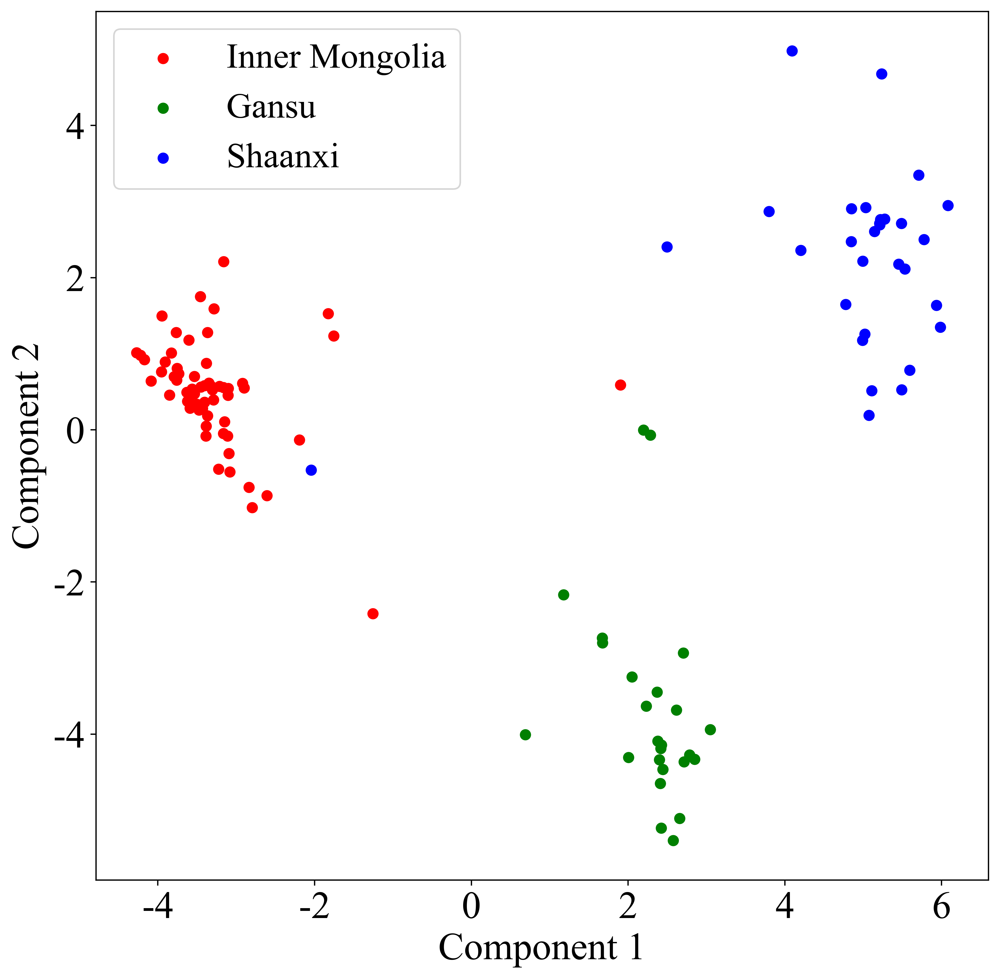

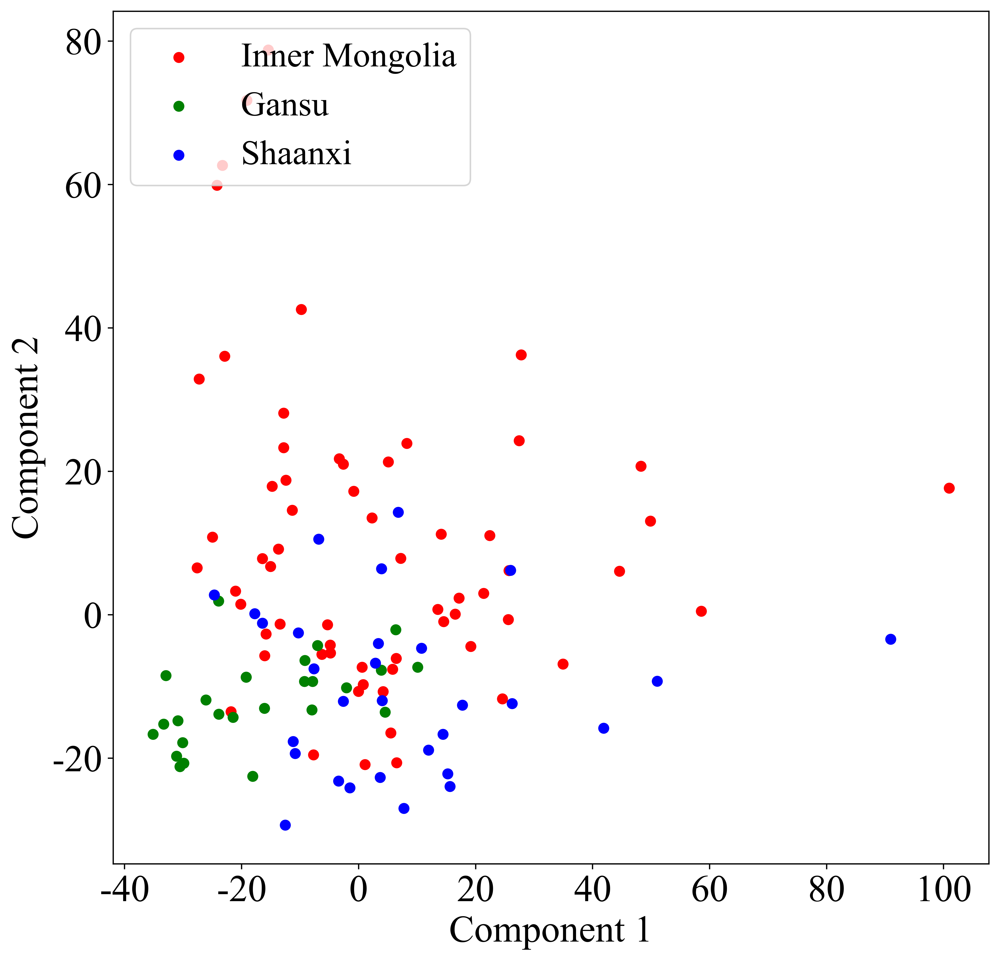

In [12]:
train_x,train_y,test_x,test_y=trandform_data_lda(X_train, y_train, X_test, y_test,2)
train_x_pca,train_y_pca,test_x_pca,test_y_pca=trandform_data_pca(X_train, y_train, X_test, y_test)
plot_pic(train_x,train_y,test_x,test_y,['Inner Mongolia','Gansu','Shaanxi'],3)
plot_pic(train_x_pca,train_y_pca,test_x_pca,test_y_pca,['Inner Mongolia','Gansu','Shaanxi'],3,'pca')

In [13]:
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='rbf',task='classification')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='sigmoid',task='classification')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='linear',task='classification')

10 rbf
train_set
ACC: 0.9879518072289156
[[44  0  1]
 [ 0 18  0]
 [ 0  0 20]]
F1: [0.98876404 1.         0.97560976]
test_set
ACC: 0.9722222222222222
[[19  0  1]
 [ 0  8  0]
 [ 0  0  8]]
F1: [0.97435897 1.         0.94117647]
10 sigmoid
train_set
ACC: 0.963855421686747
[[43  0  1]
 [ 0 17  0]
 [ 1  1 20]]
F1: [0.97727273 0.97142857 0.93023256]
test_set
ACC: 0.9444444444444444
[[18  0  0]
 [ 0  7  0]
 [ 1  1  9]]
F1: [0.97297297 0.93333333 0.9       ]
10 linear
train_set
ACC: 0.963855421686747
[[43  0  1]
 [ 0 17  0]
 [ 1  1 20]]
F1: [0.97727273 0.97142857 0.93023256]
test_set
ACC: 0.9722222222222222
[[19  0  0]
 [ 0  7  0]
 [ 0  1  9]]
F1: [1.         0.93333333 0.94736842]


In [14]:
train_xgb(train_x,train_y,test_x,test_y,learning_rate=0.9,reg_alpha=0.5,reg_lambda=50,max_depth=6,task='classification')

[14:20:35] WARNING: D:\Build\xgboost\xgboost-1.4.2.git\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
train_set
ACC: 0.9879518072289156
[[44  0  1]
 [ 0 18  0]
 [ 0  0 20]]
F1: [0.98876404 1.         0.97560976]
test_set
ACC: 0.9722222222222222
[[19  0  1]
 [ 0  8  0]
 [ 0  0  8]]
F1: [0.97435897 1.         0.94117647]


In [15]:
train_lgb(train_x,train_y,test_x,test_y,boosting_type='gbdt',learning_rate=0.3,max_depth=6,lambda_l1=0.01,lambda_l2=30,task='classification')

train_set
ACC: 0.9879518072289156
[[44  0  1]
 [ 0 18  0]
 [ 0  0 20]]
F1: [0.98876404 1.         0.97560976]
test_set
ACC: 0.9444444444444444
[[19  1  0]
 [ 0  7  1]
 [ 0  0  8]]
F1: [0.97435897 0.875      0.94117647]


## Variety discrimination——black vs. others

In [17]:
data=pd.read_excel(r"data\Raman datasets(black vs. others).xlsx")
data.columns=data.columns.astype(str)
y = data['type']
X = data.iloc[:,:-1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1,stratify = y)
data

,50.48098,52.40945,54.33792,56.26638000000001,58.19485,60.12331999999999,62.05178000000001,63.98025,65.90872,67.83719,...,3384.8,3386.729,3388.657,3390.585,3392.514,3394.442,3396.371,3398.299,3400.228,type
0,5543.1550,5412.317,5183.6220,4942.4810,4752.5550,4612.3840,4481.2700,4325.307,4057.5790,3853.2650,...,-344.9894,-221.2495,-270.7843,-342.7889,-418.2954,-510.0129,-481.1925,-404.1440,-416.0446,1
1,2373.4890,2428.599,2270.3210,2084.4690,2039.2780,2064.5900,1990.2920,1868.150,1748.0530,1626.3170,...,-933.7484,-901.6124,-879.9716,-878.1631,-926.0500,-958.4377,-1074.7330,-989.4123,-903.3283,1
2,1761.8210,1701.502,1673.7470,1627.5760,1560.0610,1491.0020,1441.0710,1360.261,1289.4350,1248.7800,...,-477.6582,-546.0452,-528.7958,-478.7501,-489.4716,-479.3889,-531.9484,-602.5038,-547.0693,1
3,4036.1890,3833.509,3629.7620,3439.1980,3298.6590,3159.7980,2953.7430,2765.683,2658.0520,2513.4300,...,-1511.8080,-1592.9190,-1590.2180,-1637.5280,-1701.8870,-1632.2050,-1692.5380,-1824.3950,-1828.6330,1
4,7713.9530,7374.457,7051.6190,6725.1810,6458.3110,6218.7570,5926.3110,5533.087,5187.1090,4928.9690,...,-1715.2330,-1805.2530,-1908.2420,-1995.8570,-2038.0440,-1877.9520,-1931.9310,-2027.5060,-2028.9870,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,1594.7830,1544.490,1457.9770,1437.5340,1441.1540,1406.1840,1283.3130,1146.703,1086.8810,1053.9200,...,-1789.4440,-1689.3750,-1670.8470,-1686.0140,-1768.9860,-1805.7220,-1874.1350,-1845.0060,-1894.2210,0
59,2591.2880,2514.407,2525.6000,2530.8530,2459.9860,2321.1500,2163.7160,2000.469,1893.8290,1744.3710,...,-2383.1140,-2526.2090,-2557.1810,-2632.3790,-2661.4390,-2584.2870,-2567.3390,-2790.8260,-2874.3460,0
60,733.2405,758.686,791.7028,825.7041,824.5447,758.8911,632.9067,613.726,594.5035,570.5277,...,-1944.4780,-1881.5520,-1920.3350,-1916.6240,-1938.6310,-1944.8630,-2016.5030,-1921.0890,-1900.0540,0
61,4138.8690,4042.207,3930.5550,3816.7810,3701.9250,3571.4770,3413.3110,3276.640,3162.6410,3040.2790,...,-427.1703,-371.1281,-400.0805,-370.1802,-401.7492,-435.8018,-431.6770,-441.2030,-501.6474,0


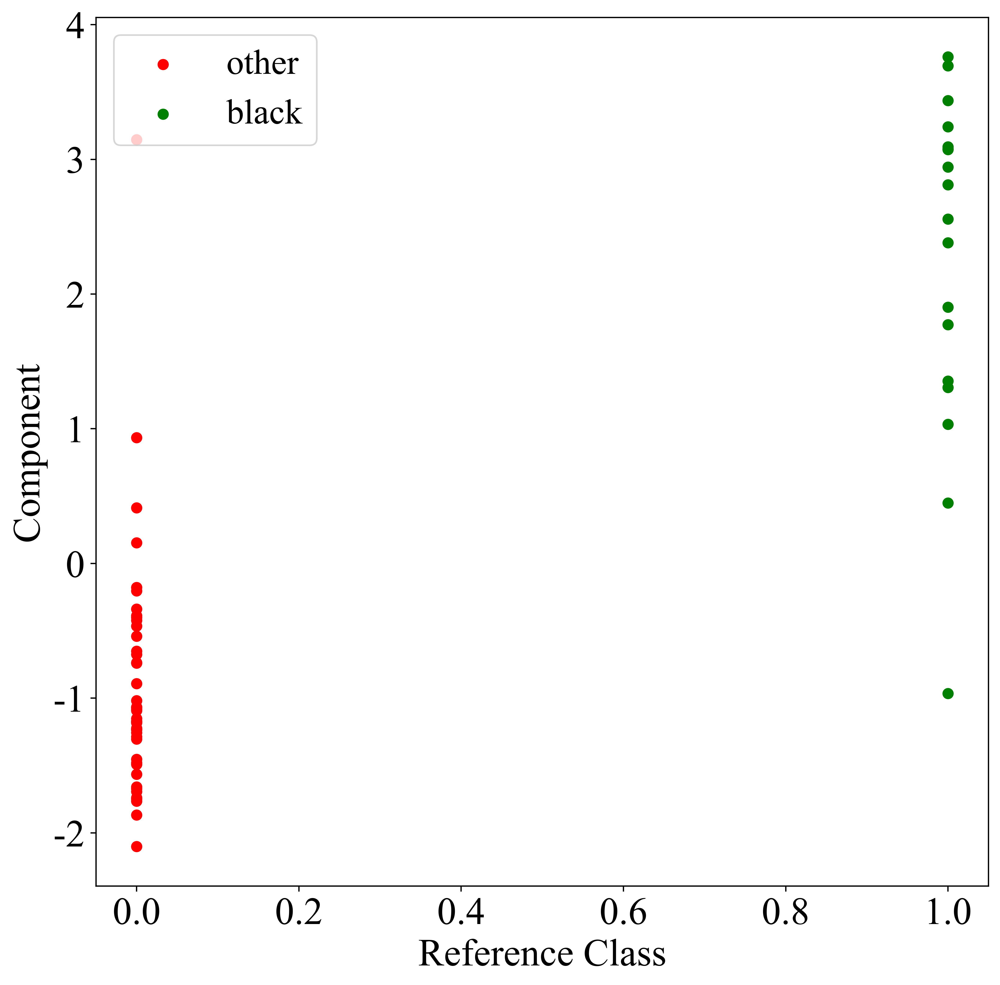

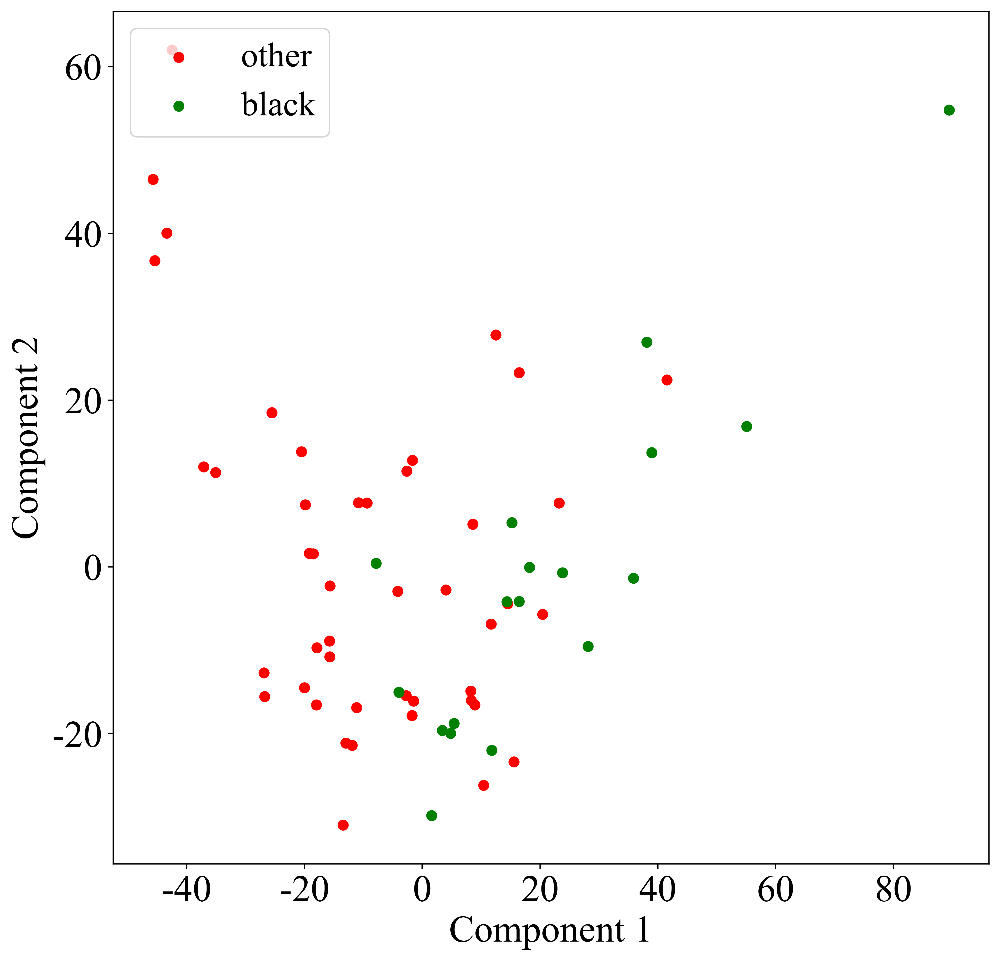

In [19]:
train_x,train_y,test_x,test_y=trandform_data_lda(X_train, y_train, X_test, y_test,1)
train_x_pca,train_y_pca,test_x_pca,test_y_pca=trandform_data_pca(X_train, y_train, X_test, y_test)
plot_pic(train_x,train_y,test_x,test_y,['other','black'],2)
plot_pic(train_x_pca,train_y_pca,test_x_pca,test_y_pca,['other','black'],2,'pca')

In [20]:
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='rbf',task='classification')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='sigmoid',task='classification')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='linear',task='classification')

10 rbf
train_set
ACC: 0.9545454545454546
[[30  1]
 [ 1 12]]
F1: [0.96774194 0.92307692]
test_set
ACC: 0.8947368421052632
[[13  1]
 [ 1  4]]
F1: [0.92857143 0.8       ]
10 sigmoid
train_set
ACC: 0.9318181818181818
[[30  2]
 [ 1 11]]
F1: [0.95238095 0.88      ]
test_set
ACC: 0.9473684210526315
[[14  1]
 [ 0  4]]
F1: [0.96551724 0.88888889]
10 linear
train_set
ACC: 0.9545454545454546
[[30  1]
 [ 1 12]]
F1: [0.96774194 0.92307692]
test_set
ACC: 0.8947368421052632
[[13  1]
 [ 1  4]]
F1: [0.92857143 0.8       ]


In [21]:
train_xgb(train_x,train_y,test_x,test_y,learning_rate=0.95,reg_alpha=0.1,reg_lambda=20,max_depth=10,task='classification')

[14:20:40] WARNING: D:\Build\xgboost\xgboost-1.4.2.git\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
train_set
ACC: 0.9545454545454546
[[30  1]
 [ 1 12]]
F1: [0.96774194 0.92307692]
test_set
ACC: 0.8947368421052632
[[13  1]
 [ 1  4]]
F1: [0.92857143 0.8       ]


In [22]:
train_lgb(train_x,train_y,test_x,test_y,boosting_type='gbdt',learning_rate=0.9,max_depth=10,lambda_l1=0.7,lambda_l2=0.9,task='classification')

train_set
ACC: 0.9318181818181818
[[29  1]
 [ 2 12]]
F1: [0.95081967 0.88888889]
test_set
ACC: 0.8947368421052632
[[12  0]
 [ 2  5]]
F1: [0.92307692 0.83333333]


## Variety discrimination——wild vs. cultivated

In [23]:
data=pd.read_excel(r"data\Raman datasets(wild vs cultivated).xlsx")
data.columns=data.columns.astype(str)
y = data['type']
X = data.iloc[:,:-1]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1,stratify = y)
data

,50.04522,51.97368,53.90215,55.83062,57.75908,59.68755,61.61602,63.54448,65.47295,67.40141,...,3384.364,3386.293,3388.221,3390.15,3392.078,3394.007,3395.935,3397.864,3399.792,type
0,2586.5290,2571.6410,2496.0120,2325.4370,2194.7340,2155.0440,2074.7500,1951.0710,1898.8600,1819.8130,...,-2635.3270,-2749.4580,-2850.6390,-2887.7700,-2872.0680,-3014.0880,-2922.2270,-3013.4970,-3038.4230,0
1,4502.7450,4389.6760,4147.6490,3914.7580,3793.7630,3749.9160,3544.7150,3225.5010,3036.0530,2919.3080,...,-1694.6050,-1770.3460,-1836.9500,-1863.0350,-1735.8930,-1746.2770,-1815.9590,-2053.1650,-2011.6200,0
2,2991.0620,2839.9610,2699.0540,2591.9970,2531.0510,2497.5700,2435.3700,2342.9160,2220.1300,2068.8140,...,-3455.0110,-3324.7020,-3509.7330,-3583.3230,-3487.2870,-3492.4800,-3478.4470,-3574.1520,-3633.8490,0
3,3592.7970,3461.0040,3327.6090,3163.5590,3026.9350,2942.0090,2858.0280,2711.8030,2565.7190,2436.5090,...,-1295.9580,-1203.2720,-1330.4140,-1308.5940,-1250.5570,-1355.9170,-1262.8130,-1320.8070,-1494.3340,0
4,6146.1400,5885.5650,5632.1670,5373.7860,5174.4380,5051.7130,4933.4130,4741.2610,4553.1130,4310.7580,...,-1529.0490,-1714.1670,-1702.7210,-1843.5590,-1750.9070,-1692.7310,-1803.2740,-1828.0650,-1823.4550,0
5,3984.4140,3782.5330,3639.6740,3500.1830,3362.3580,3207.9750,3018.9480,2826.9140,2640.5500,2492.5030,...,-3326.5540,-3320.4650,-3440.7030,-3513.7830,-3536.2740,-3514.1930,-3599.2860,-3731.6660,-3612.2470,0
6,3338.8970,3271.8320,3167.0980,3014.5670,2920.1080,2836.8160,2657.9580,2430.2560,2299.7570,2162.7860,...,-1616.6820,-1750.8300,-1845.7790,-1839.9510,-1810.1870,-1890.0920,-2006.9470,-1953.7050,-2071.6360,0
7,719.3524,671.4841,662.0359,649.3728,607.2358,556.7518,530.1033,463.3723,408.7671,366.4879,...,-1929.7660,-1942.3730,-2009.8720,-2090.0240,-2076.4900,-2071.4220,-2159.5190,-2156.3820,-2181.1990,0
8,3921.6370,3784.5540,3595.3780,3410.2400,3295.7060,3228.1530,3133.8130,2949.2750,2782.4640,2622.2490,...,-923.5519,-823.5118,-916.9200,-981.9321,-872.2211,-906.9889,-1025.1150,-1055.5450,-1090.8010,0
9,2556.4080,2545.1820,2424.0030,2292.6510,2236.1770,2207.2540,2105.4140,1968.8380,1758.1270,1658.8960,...,-1109.5250,-1215.8090,-1106.8190,-1168.9210,-1300.1450,-1373.4420,-1378.0200,-1383.6790,-1373.9040,0


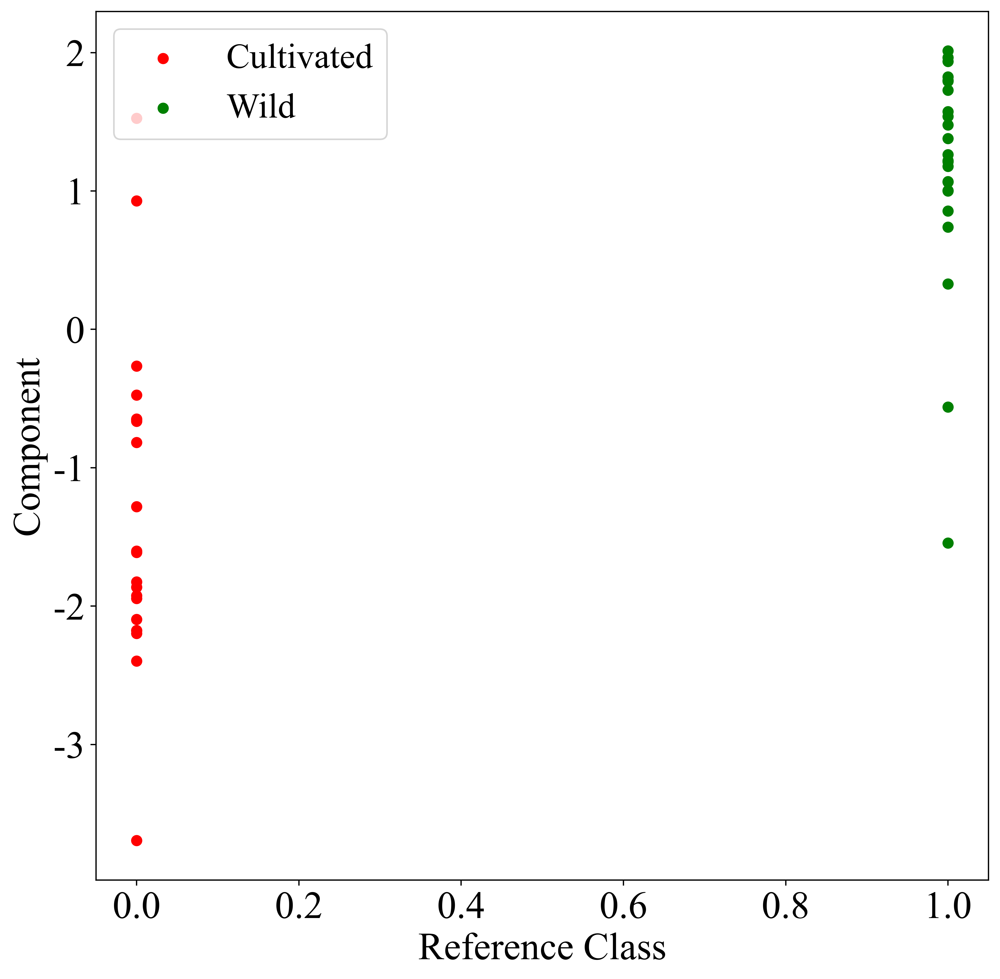

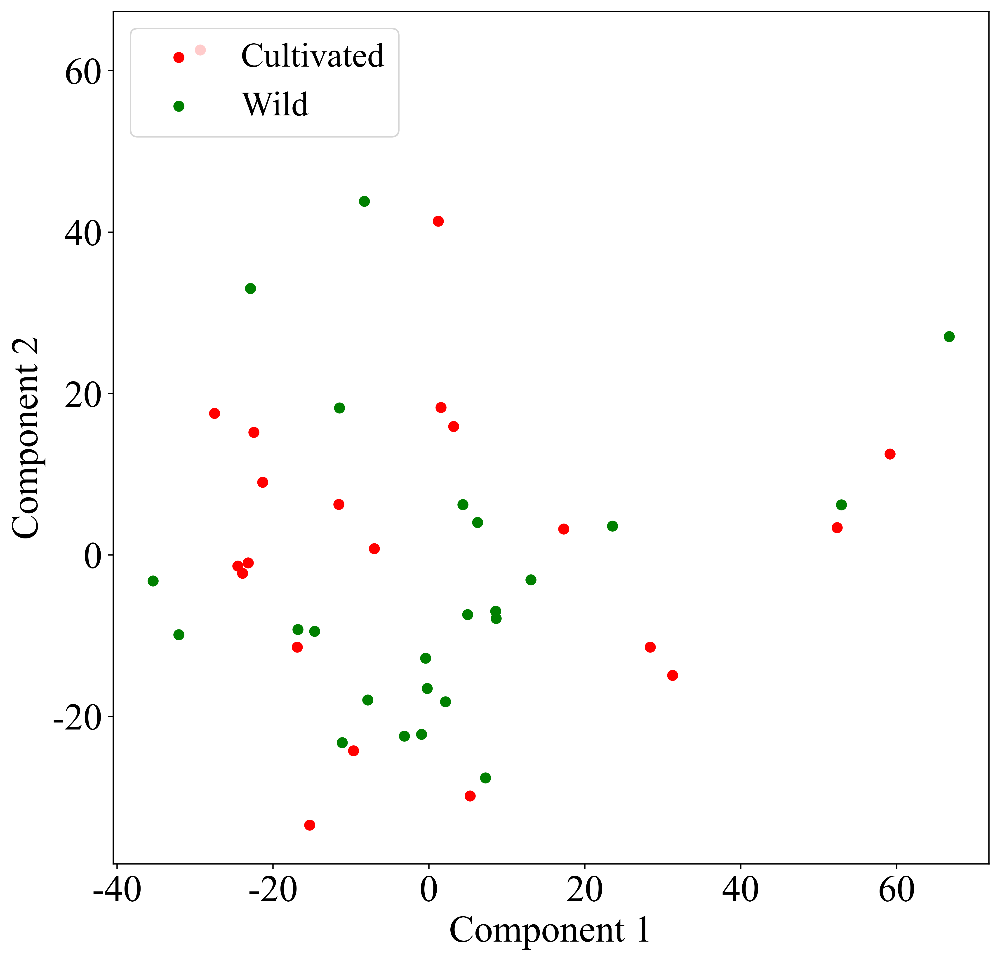

In [25]:
train_x,train_y,test_x,test_y=trandform_data_lda(X_train, y_train, X_test, y_test,1)
train_x_pca,train_y_pca,test_x_pca,test_y_pca=trandform_data_pca(X_train, y_train, X_test, y_test)
plot_pic(train_x,train_y,test_x,test_y,['Cultivated','Wild'],2)
plot_pic(train_x_pca,train_y_pca,test_x_pca,test_y_pca,['Cultivated','Wild'],2,'pca')

In [26]:
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='rbf',task='classification')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='sigmoid',task='classification')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='linear',task='classification')

10 rbf
train_set
ACC: 0.9354838709677419
[[13  1]
 [ 1 16]]
F1: [0.92857143 0.94117647]
test_set
ACC: 0.8571428571428571
[[6 1]
 [1 6]]
F1: [0.85714286 0.85714286]
10 sigmoid
train_set
ACC: 0.9354838709677419
[[13  1]
 [ 1 16]]
F1: [0.92857143 0.94117647]
test_set
ACC: 0.8571428571428571
[[6 1]
 [1 6]]
F1: [0.85714286 0.85714286]
10 linear
train_set
ACC: 0.9354838709677419
[[13  1]
 [ 1 16]]
F1: [0.92857143 0.94117647]
test_set
ACC: 0.8571428571428571
[[6 1]
 [1 6]]
F1: [0.85714286 0.85714286]


In [27]:
train_xgb(train_x,train_y,test_x,test_y,learning_rate=0.9,reg_alpha=0.1,reg_lambda=0.05,max_depth=10,task='classification')

[14:20:45] WARNING: D:\Build\xgboost\xgboost-1.4.2.git\src\learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
train_set
ACC: 0.9354838709677419
[[13  1]
 [ 1 16]]
F1: [0.92857143 0.94117647]
test_set
ACC: 0.8571428571428571
[[6 1]
 [1 6]]
F1: [0.85714286 0.85714286]


In [28]:
train_lgb(train_x,train_y,test_x,test_y,boosting_type='gbdt',learning_rate=0.9,max_depth=10,lambda_l1=0.1,lambda_l2=0.5,task='classification')

train_set
ACC: 0.5483870967741935
[[ 0  0]
 [14 17]]
F1: [0.         0.70833333]
test_set
ACC: 0.5
[[0 0]
 [7 7]]
F1: [0.         0.66666667]


## Regression Analysis for the Determination of Major Component Content

In [29]:
data=pd.read_excel(r"data\Raman datasets(with major component content).xlsx")
data

,50.32098,52.24945,54.17791999999999,56.10638,58.03485,59.96332,61.89178,63.82025,65.74871999999999,67.67719,...,3390.426,3392.354,3394.282,3396.211,3398.139,3400.068,type,ssa,ssc,ssd
0,2137.808,2108.2400,2127.1430,2145.3740,2068.8860,1926.7920,1816.0830,1811.2350,1850.1810,1709.2120,...,-1995.2750,-2019.9670,-2214.8860,-2213.3020,-1983.1690,-2022.7500,0,40.00,8.74,19.45
1,843.015,778.0334,737.3646,775.0638,793.3551,778.0346,764.8843,799.1901,729.8372,681.7089,...,-698.9503,-802.5234,-787.3817,-799.3686,-728.0889,-727.4656,0,40.00,8.74,19.45
2,2443.815,2335.8090,2307.1140,2272.3710,2265.8010,2230.3550,2099.7120,2051.8730,2003.2500,1881.3240,...,-2625.6390,-2659.9940,-2598.0200,-2584.0160,-2563.7860,-2430.7110,0,40.00,8.74,19.45
3,0.000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,40.00,8.74,19.45
4,0.000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,40.00,8.74,19.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114,7194.897,7045.0840,6798.2550,6583.2910,6433.6070,6232.0840,5840.9880,5475.5850,5241.2030,4997.4010,...,-1650.5250,-1407.7730,-1394.0070,-1560.3690,-1564.2500,-1654.8170,3,81.24,27.81,62.54
115,2434.696,2461.0790,2377.7660,2311.0330,2284.1400,2239.3900,2108.5370,2032.0450,1880.9340,1782.6240,...,-645.9922,-726.5323,-719.6520,-645.3281,-623.3464,-742.0666,3,81.24,27.81,62.54
116,2446.302,2434.9180,2371.5140,2302.1310,2236.9860,2133.4190,1955.7180,1883.6320,1768.0770,1656.3520,...,-1306.7920,-1358.3370,-1422.4220,-1421.1300,-1417.9710,-1386.7820,3,81.24,27.81,62.54
117,5120.415,5129.1000,5085.6540,4857.7210,4630.4700,4465.0690,4330.4150,4100.6720,3836.0710,3650.7480,...,-1264.7390,-1246.8540,-1183.2370,-1321.9640,-1473.5520,-1473.5650,3,81.24,27.81,62.54


### (1)SSa

In [30]:
data.columns=data.columns.astype(str)
y = data['ssa']
X = data.iloc[:,:-3]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1,stratify = y)
X_train

,50.32098,52.24945,54.17791999999999,56.10638,58.03485,59.96332,61.89178,63.82025,65.74871999999999,67.67719,...,3384.64,3386.569,3388.497,3390.426,3392.354,3394.282,3396.211,3398.139,3400.068,type
2,2443.8150,2335.8090,2307.1140,2272.3710,2265.8010,2230.3550,2099.7120,2051.8730,2003.2500,1881.3240,...,-2487.3290,-2298.6020,-2433.7330,-2625.6390,-2659.9940,-2598.0200,-2584.0160,-2563.7860,-2430.7110,0
3,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0
27,2418.9710,2299.0490,2236.6970,2182.1120,2138.8420,2096.7000,2011.6980,1966.7760,1877.8120,1785.5100,...,-951.5793,-1082.1120,-1052.8200,-1007.4630,-1146.4050,-1095.6390,-1026.9260,-1005.1690,-1011.3650,4
61,719.3524,671.4841,662.0359,649.3728,607.2358,556.7518,530.1033,463.3723,408.7671,366.4879,...,-1929.7660,-1942.3730,-2009.8720,-2090.0240,-2076.4900,-2071.4220,-2159.5190,-2156.3820,-2181.1990,1
94,2398.9590,2325.7300,2219.4540,2128.6540,2075.4500,2037.1730,1933.6260,1815.6680,1717.8120,1618.8990,...,-2546.0830,-2576.3030,-2604.2820,-2816.7390,-2793.2290,-2690.8830,-2743.3370,-3017.0070,-2977.5420,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36,4943.4780,4768.6790,4664.1390,4551.0440,4421.7490,4286.7340,4168.4910,4028.6530,3886.2550,3787.8570,...,-1669.6360,-1775.6350,-1678.5240,-1598.4140,-1676.2600,-1609.6750,-1589.4580,-1599.8190,-1673.1570,4
60,3338.8970,3271.8320,3167.0980,3014.5670,2920.1080,2836.8160,2657.9580,2430.2560,2299.7570,2162.7860,...,-1616.6820,-1750.8300,-1845.7790,-1839.9510,-1810.1870,-1890.0920,-2006.9470,-1953.7050,-2071.6360,1
97,2936.3650,2870.6760,2795.5520,2717.4100,2623.6000,2513.6030,2399.1890,2322.3630,2245.5810,2152.9420,...,-267.8840,-257.9437,-277.4156,-275.2589,-289.8712,-281.4268,-271.3278,-307.5758,-314.5744,2
52,1096.1410,1068.4780,1061.3720,1051.5490,988.8376,965.9277,1082.8940,1015.6720,934.5080,840.7358,...,-1941.9620,-1904.2930,-1983.4290,-2168.3170,-2194.2330,-2127.7160,-2191.2140,-2201.2900,-2237.9470,4


In [32]:
train_x,train_y,test_x,test_y=trandform_data_lda(X_train, y_train, X_test, y_test,2)
train_x_pca,train_y_pca,test_x_pca,test_y_pca=trandform_data_pca(X_train, y_train, X_test, y_test)

30 rbf
r2: 0.9427299380231748
mse: 5.769304787824378


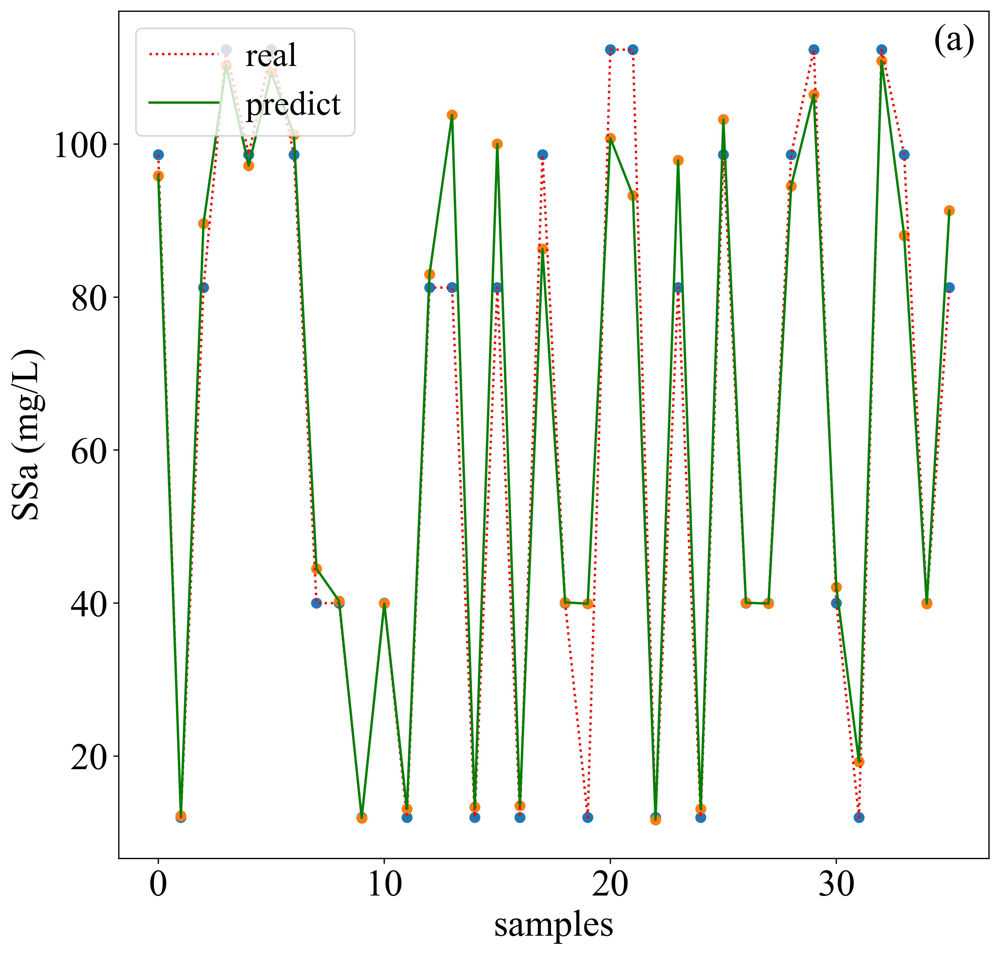

10 sigmoid
r2: 0.7520549002312709
mse: 16.371797132938745


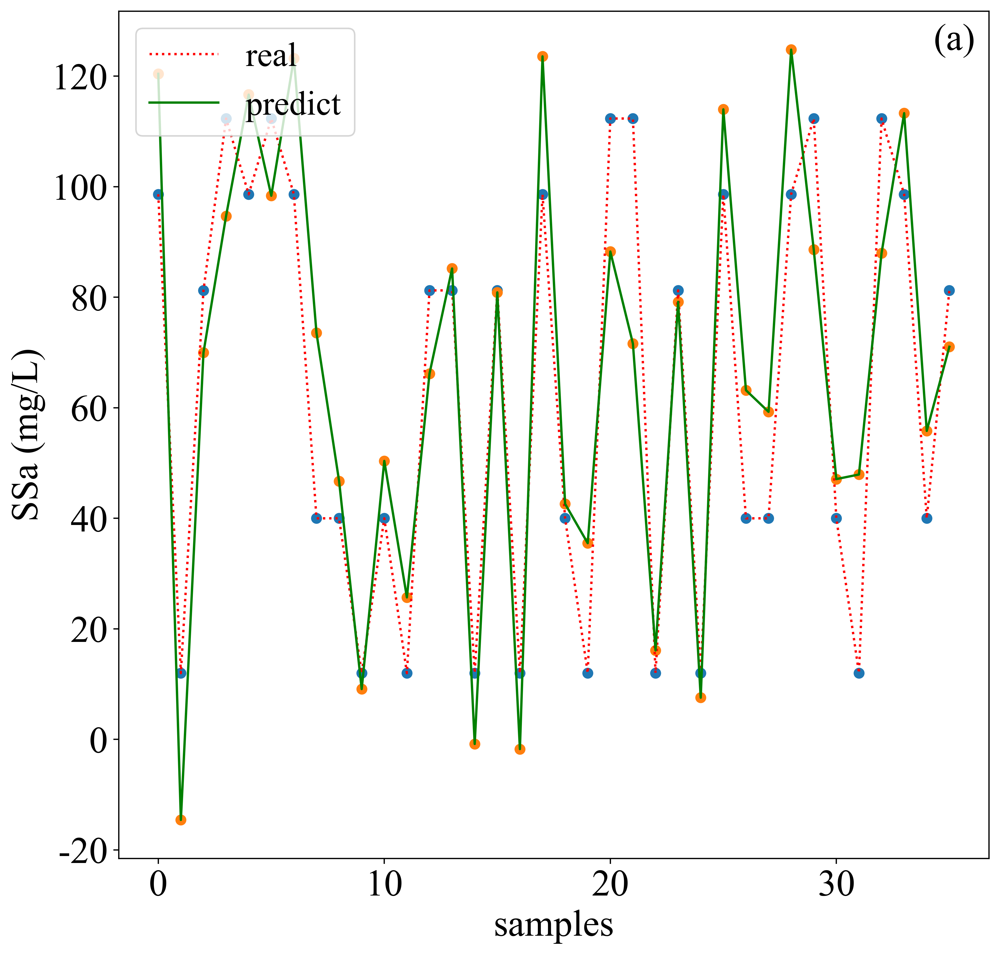

10 linear
r2: 0.9062326667668691
mse: 8.380088134010517


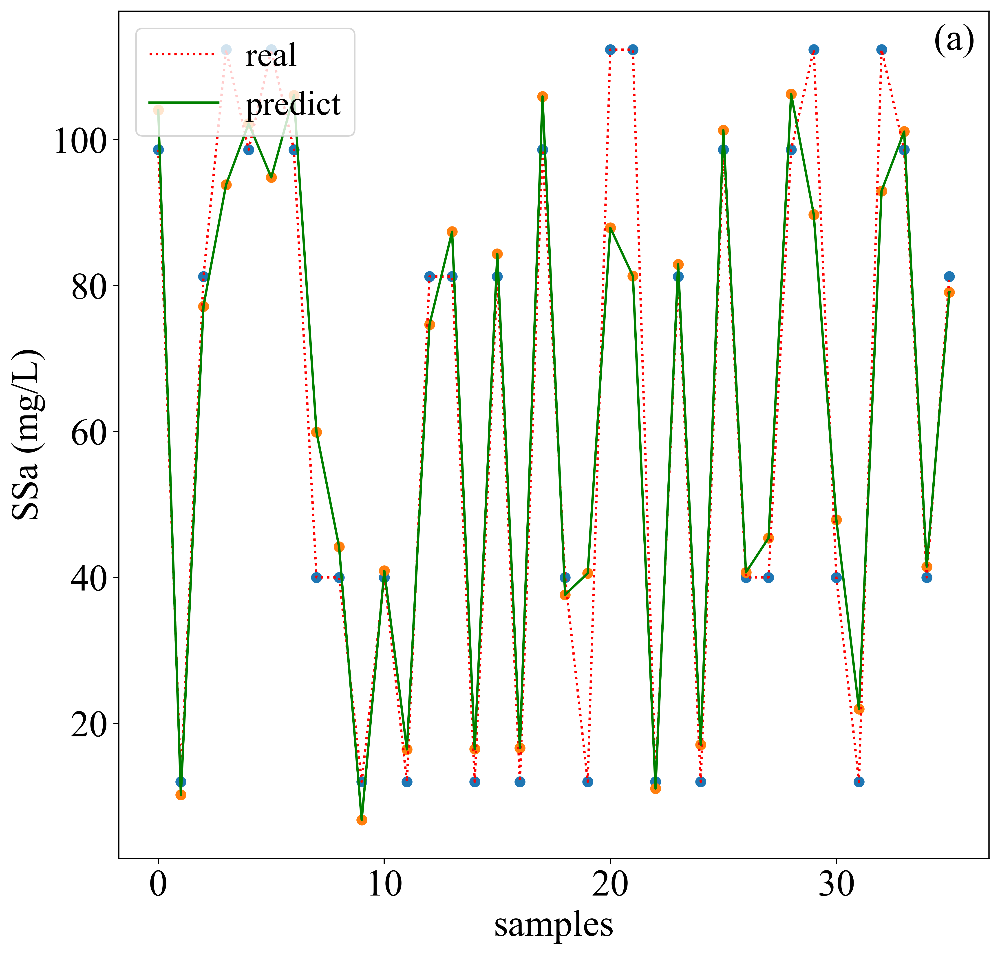

In [33]:
train_svm(train_x,train_y,test_x,test_y,C=30,kernel='rbf',task='regression',regression_label='SSa',poisition='(a)')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='sigmoid',task='regression',regression_label='SSa',poisition='(a)')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='linear',task='regression',regression_label='SSa',poisition='(a)')

r2: 0.8328219815054709
mse: 10.037459874682956


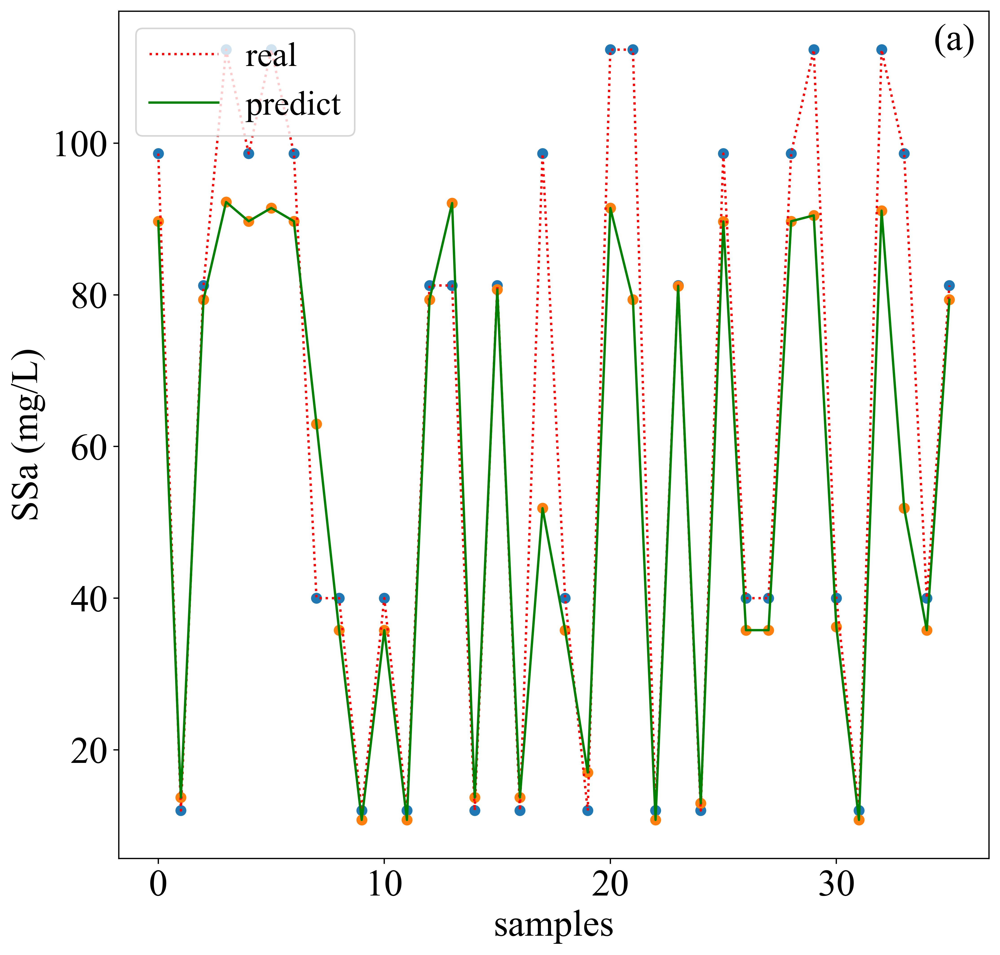

In [34]:
train_xgb(train_x,train_y,test_x,test_y,learning_rate=0.9,reg_alpha=0.1,reg_lambda=0.1,max_depth=6,task='regression',regression_label='SSa',poisition='(a)')

r2: 0.9385321122778645
mse: 4.168810099213679


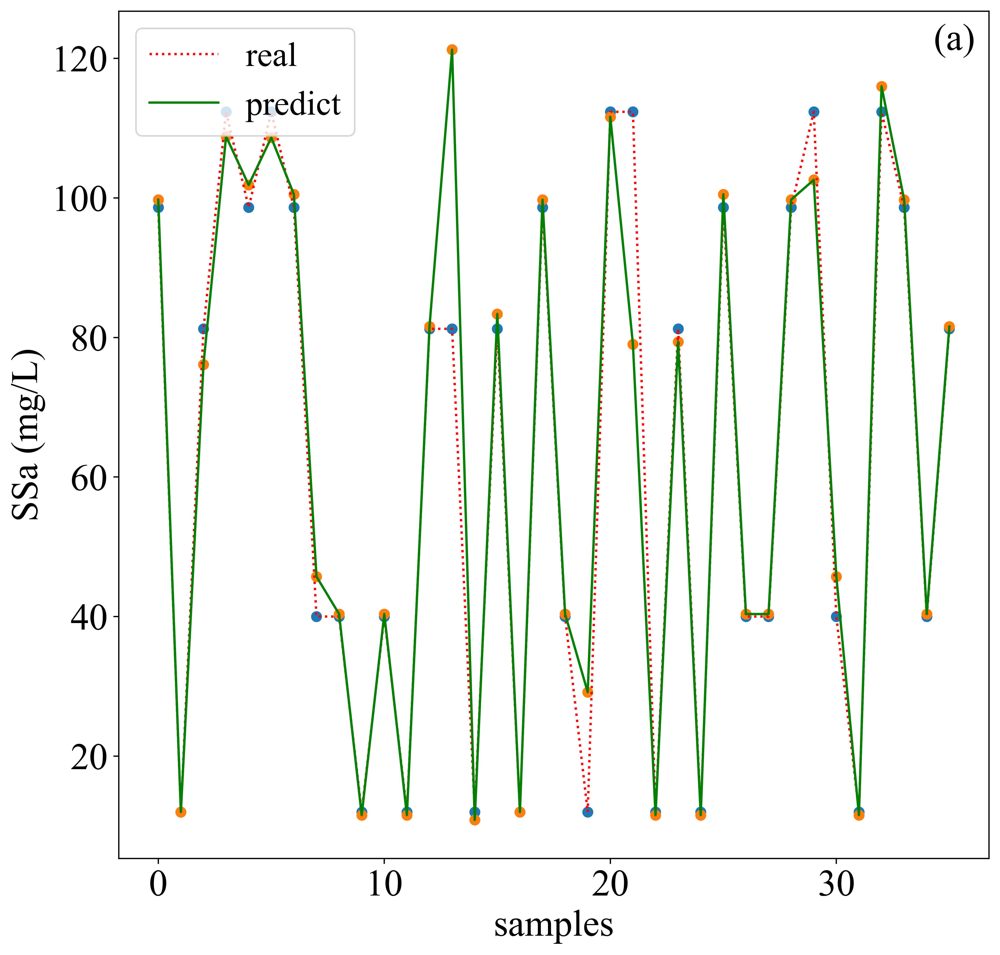

In [35]:
train_lgb(train_x,train_y,test_x,test_y,boosting_type='gbdt',learning_rate=0.9,max_depth=6,lambda_l1=5,lambda_l2=5,task='regression',regression_label='SSa',poisition='(a)')

### (2)SSc

In [36]:
data.columns=data.columns.astype(str)
y = data['ssc']
X = data.iloc[:,:-3]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1,stratify = y)
X_train

,50.32098,52.24945,54.17791999999999,56.10638,58.03485,59.96332,61.89178,63.82025,65.74871999999999,67.67719,...,3384.64,3386.569,3388.497,3390.426,3392.354,3394.282,3396.211,3398.139,3400.068,type
2,2443.8150,2335.8090,2307.1140,2272.3710,2265.8010,2230.3550,2099.7120,2051.8730,2003.2500,1881.3240,...,-2487.3290,-2298.6020,-2433.7330,-2625.6390,-2659.9940,-2598.0200,-2584.0160,-2563.7860,-2430.7110,0
3,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0
27,2418.9710,2299.0490,2236.6970,2182.1120,2138.8420,2096.7000,2011.6980,1966.7760,1877.8120,1785.5100,...,-951.5793,-1082.1120,-1052.8200,-1007.4630,-1146.4050,-1095.6390,-1026.9260,-1005.1690,-1011.3650,4
61,719.3524,671.4841,662.0359,649.3728,607.2358,556.7518,530.1033,463.3723,408.7671,366.4879,...,-1929.7660,-1942.3730,-2009.8720,-2090.0240,-2076.4900,-2071.4220,-2159.5190,-2156.3820,-2181.1990,1
94,2398.9590,2325.7300,2219.4540,2128.6540,2075.4500,2037.1730,1933.6260,1815.6680,1717.8120,1618.8990,...,-2546.0830,-2576.3030,-2604.2820,-2816.7390,-2793.2290,-2690.8830,-2743.3370,-3017.0070,-2977.5420,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36,4943.4780,4768.6790,4664.1390,4551.0440,4421.7490,4286.7340,4168.4910,4028.6530,3886.2550,3787.8570,...,-1669.6360,-1775.6350,-1678.5240,-1598.4140,-1676.2600,-1609.6750,-1589.4580,-1599.8190,-1673.1570,4
60,3338.8970,3271.8320,3167.0980,3014.5670,2920.1080,2836.8160,2657.9580,2430.2560,2299.7570,2162.7860,...,-1616.6820,-1750.8300,-1845.7790,-1839.9510,-1810.1870,-1890.0920,-2006.9470,-1953.7050,-2071.6360,1
97,2936.3650,2870.6760,2795.5520,2717.4100,2623.6000,2513.6030,2399.1890,2322.3630,2245.5810,2152.9420,...,-267.8840,-257.9437,-277.4156,-275.2589,-289.8712,-281.4268,-271.3278,-307.5758,-314.5744,2
52,1096.1410,1068.4780,1061.3720,1051.5490,988.8376,965.9277,1082.8940,1015.6720,934.5080,840.7358,...,-1941.9620,-1904.2930,-1983.4290,-2168.3170,-2194.2330,-2127.7160,-2191.2140,-2201.2900,-2237.9470,4


In [38]:
train_x,train_y,test_x,test_y=trandform_data_lda(X_train, y_train, X_test, y_test,2)
train_x_pca,train_y_pca,test_x_pca,test_y_pca=trandform_data_pca(X_train, y_train, X_test, y_test)

1200 rbf
r2: 0.934551251059948
mse: 2.3785838858007002


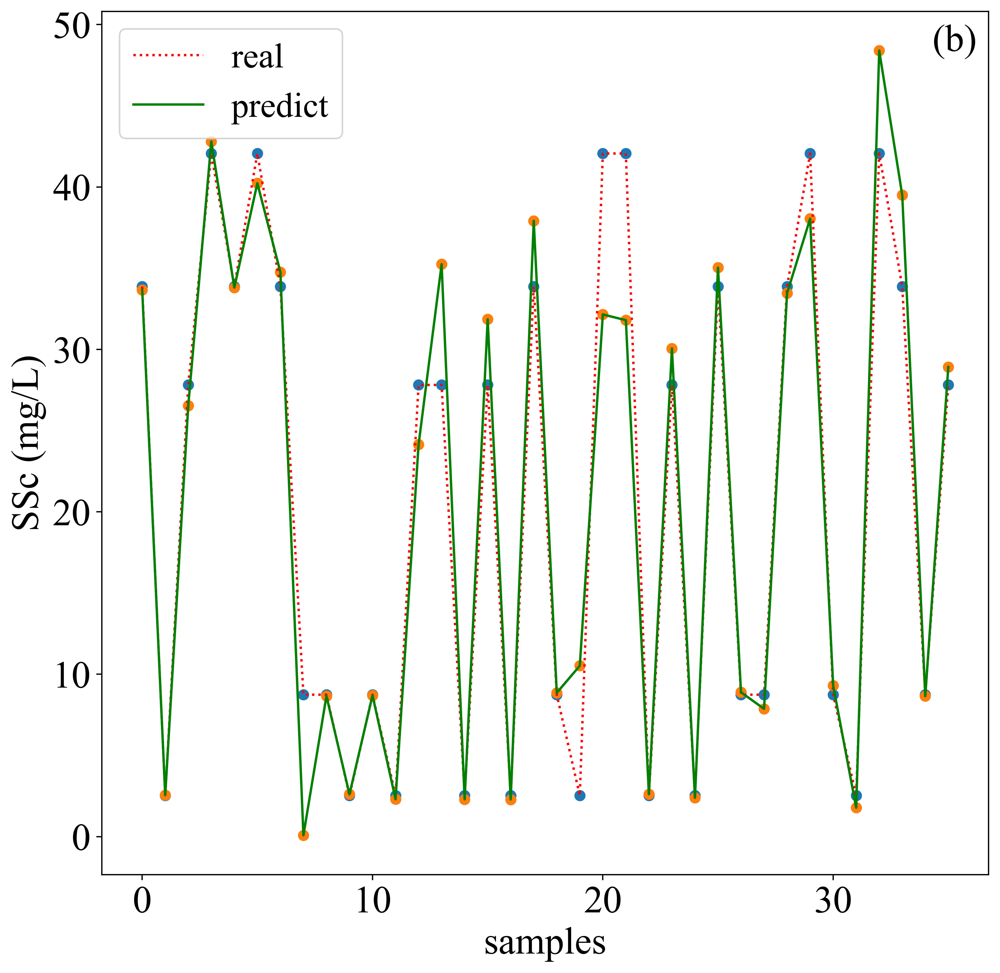

10 sigmoid
r2: -0.29007192655240144
mse: 14.238945461800094


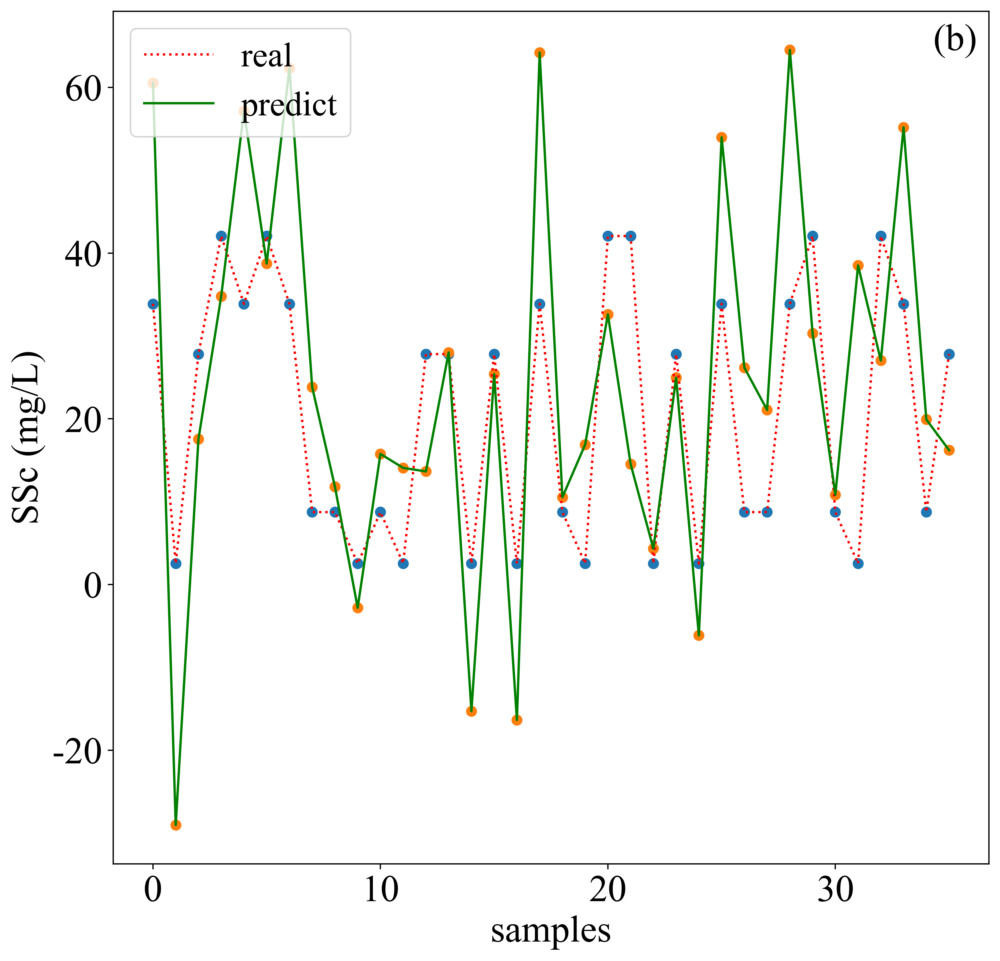

10 linear
r2: 0.8562650642629391
mse: 3.930520950555557


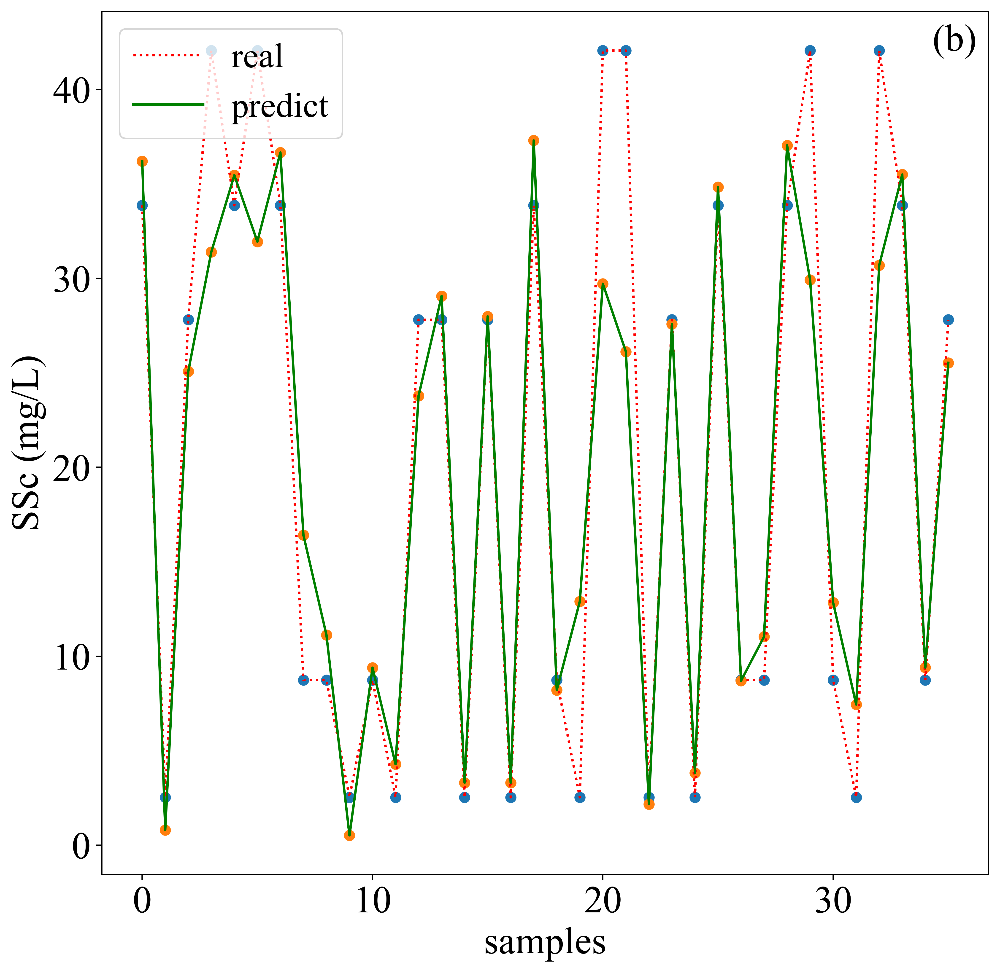

In [39]:
train_svm(train_x,train_y,test_x,test_y,C=1200,kernel='rbf',task='regression',regression_label='SSc',poisition='(b)')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='sigmoid',task='regression',regression_label='SSc',poisition='(b)')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='linear',task='regression',regression_label='SSc',poisition='(b)')

r2: 0.8210278028494797
mse: 4.370561427540249


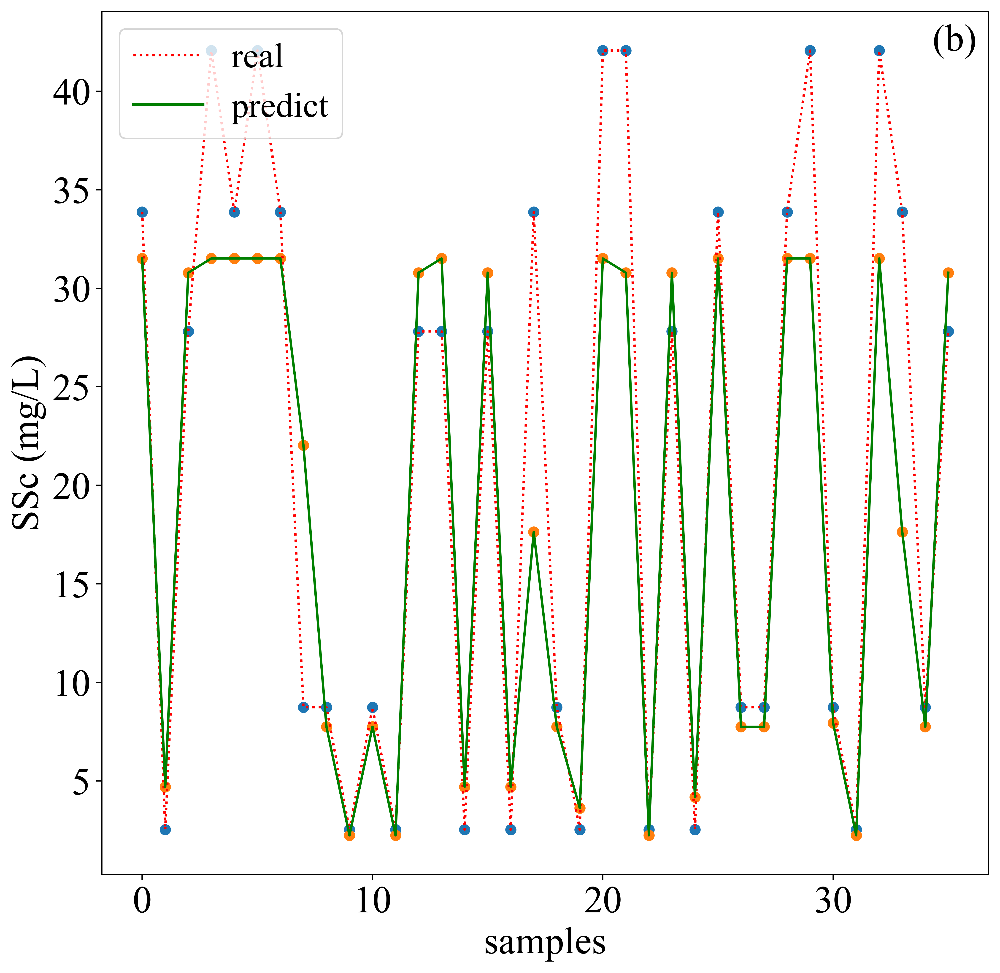

In [40]:
train_xgb(train_x,train_y,test_x,test_y,learning_rate=0.95,reg_alpha=0.95,reg_lambda=0.95,max_depth=6,task='regression',regression_label='SSc',poisition='(b)')

r2: 0.9218175011550381
mse: 2.9207754993456643


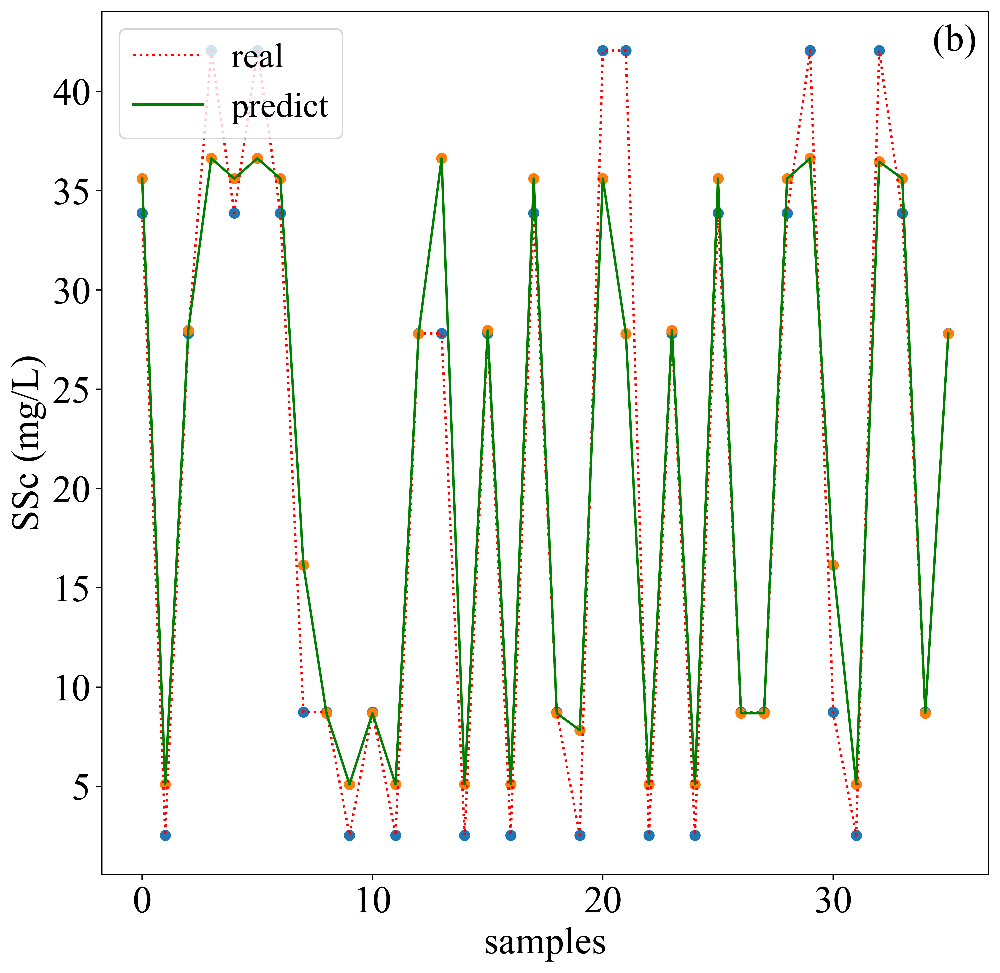

In [41]:
train_lgb(train_x,train_y,test_x,test_y,boosting_type='gbdt',learning_rate=0.9,max_depth=6,lambda_l1=50,lambda_l2=150,task='regression',regression_label='SSc',poisition='(b)')

### (3)SSd

In [42]:
data.columns=data.columns.astype(str)
y = data['ssd']
X = data.iloc[:,:-3]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1,stratify = y)
X_train

,50.32098,52.24945,54.17791999999999,56.10638,58.03485,59.96332,61.89178,63.82025,65.74871999999999,67.67719,...,3384.64,3386.569,3388.497,3390.426,3392.354,3394.282,3396.211,3398.139,3400.068,type
2,2443.8150,2335.8090,2307.1140,2272.3710,2265.8010,2230.3550,2099.7120,2051.8730,2003.2500,1881.3240,...,-2487.3290,-2298.6020,-2433.7330,-2625.6390,-2659.9940,-2598.0200,-2584.0160,-2563.7860,-2430.7110,0
3,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0
27,2418.9710,2299.0490,2236.6970,2182.1120,2138.8420,2096.7000,2011.6980,1966.7760,1877.8120,1785.5100,...,-951.5793,-1082.1120,-1052.8200,-1007.4630,-1146.4050,-1095.6390,-1026.9260,-1005.1690,-1011.3650,4
61,719.3524,671.4841,662.0359,649.3728,607.2358,556.7518,530.1033,463.3723,408.7671,366.4879,...,-1929.7660,-1942.3730,-2009.8720,-2090.0240,-2076.4900,-2071.4220,-2159.5190,-2156.3820,-2181.1990,1
94,2398.9590,2325.7300,2219.4540,2128.6540,2075.4500,2037.1730,1933.6260,1815.6680,1717.8120,1618.8990,...,-2546.0830,-2576.3030,-2604.2820,-2816.7390,-2793.2290,-2690.8830,-2743.3370,-3017.0070,-2977.5420,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36,4943.4780,4768.6790,4664.1390,4551.0440,4421.7490,4286.7340,4168.4910,4028.6530,3886.2550,3787.8570,...,-1669.6360,-1775.6350,-1678.5240,-1598.4140,-1676.2600,-1609.6750,-1589.4580,-1599.8190,-1673.1570,4
60,3338.8970,3271.8320,3167.0980,3014.5670,2920.1080,2836.8160,2657.9580,2430.2560,2299.7570,2162.7860,...,-1616.6820,-1750.8300,-1845.7790,-1839.9510,-1810.1870,-1890.0920,-2006.9470,-1953.7050,-2071.6360,1
97,2936.3650,2870.6760,2795.5520,2717.4100,2623.6000,2513.6030,2399.1890,2322.3630,2245.5810,2152.9420,...,-267.8840,-257.9437,-277.4156,-275.2589,-289.8712,-281.4268,-271.3278,-307.5758,-314.5744,2
52,1096.1410,1068.4780,1061.3720,1051.5490,988.8376,965.9277,1082.8940,1015.6720,934.5080,840.7358,...,-1941.9620,-1904.2930,-1983.4290,-2168.3170,-2194.2330,-2127.7160,-2191.2140,-2201.2900,-2237.9470,4


In [44]:
train_x,train_y,test_x,test_y=trandform_data_lda(X_train, y_train, X_test, y_test,2)
train_x_pca,train_y_pca,test_x_pca,test_y_pca=trandform_data_pca(X_train, y_train, X_test, y_test)

150 rbf
r2: 0.9527796481929947
mse: 3.8178381359453266


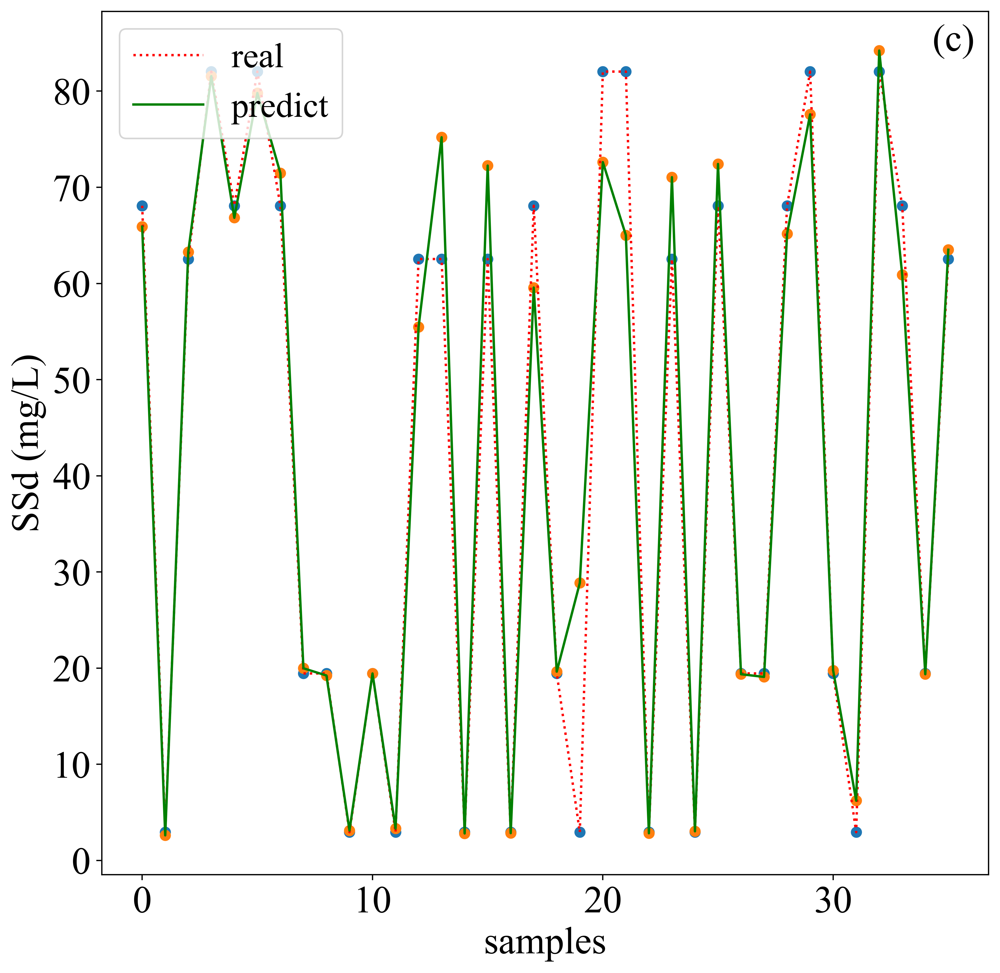

10 sigmoid
r2: 0.5241796491697261
mse: 17.72259321335889


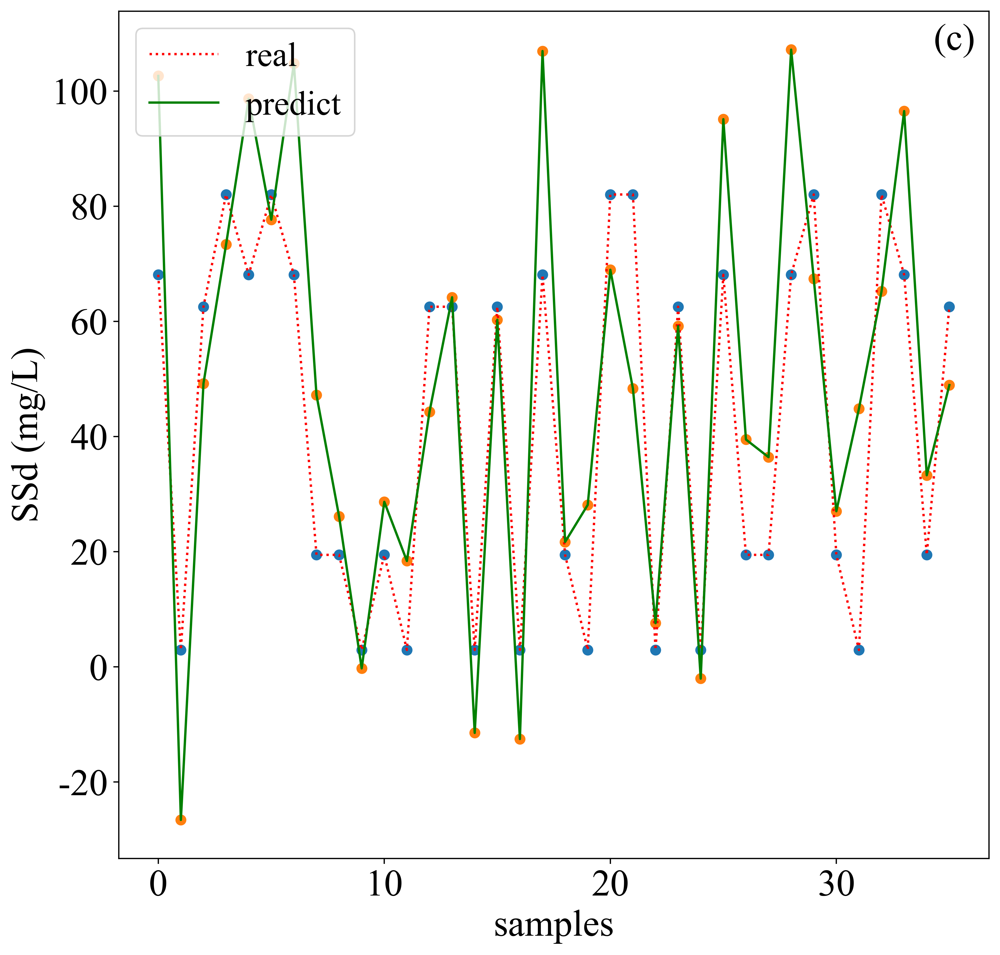

10 linear
r2: 0.885560650122072
mse: 8.33970569899816


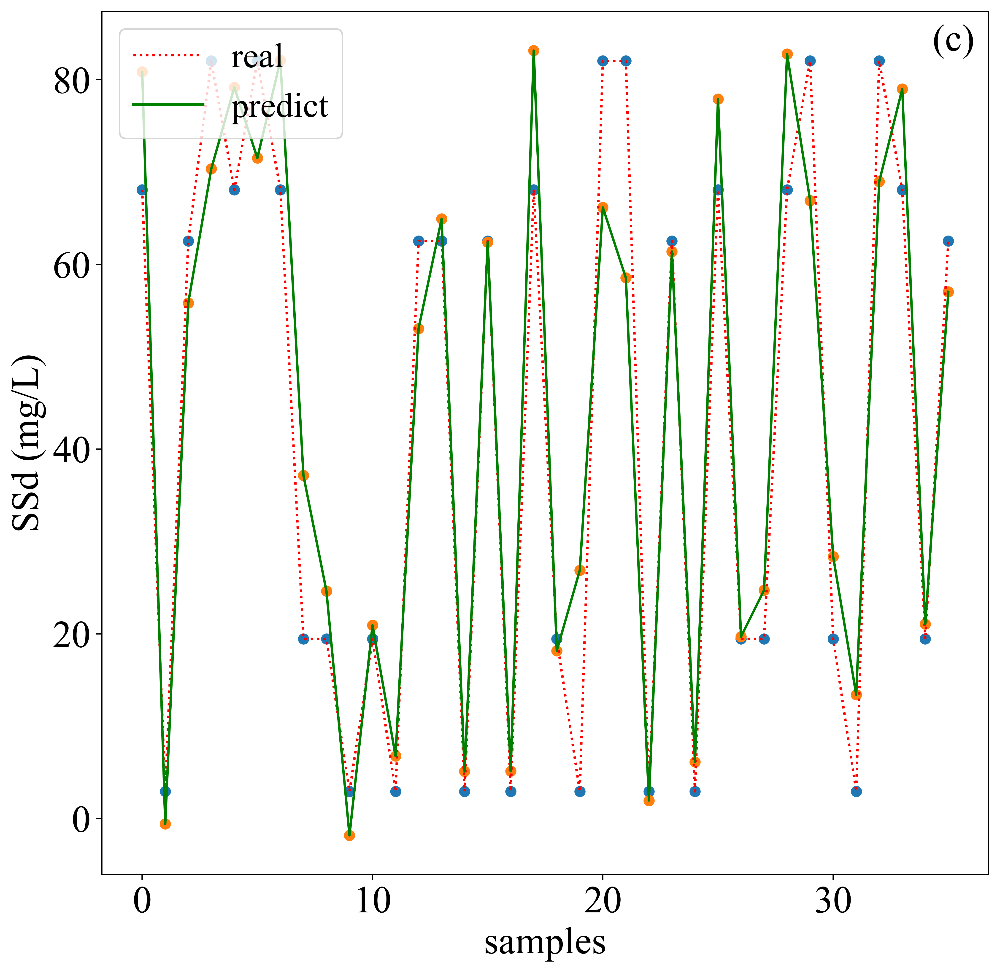

In [45]:
train_svm(train_x,train_y,test_x,test_y,C=150,kernel='rbf',task='regression',regression_label='SSd',poisition='(c)')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='sigmoid',task='regression',regression_label='SSd',poisition='(c)')
train_svm(train_x,train_y,test_x,test_y,C=10,kernel='linear',task='regression',regression_label='SSd',poisition='(c)')

r2: 0.8616784980971673
mse: 7.265575777424707


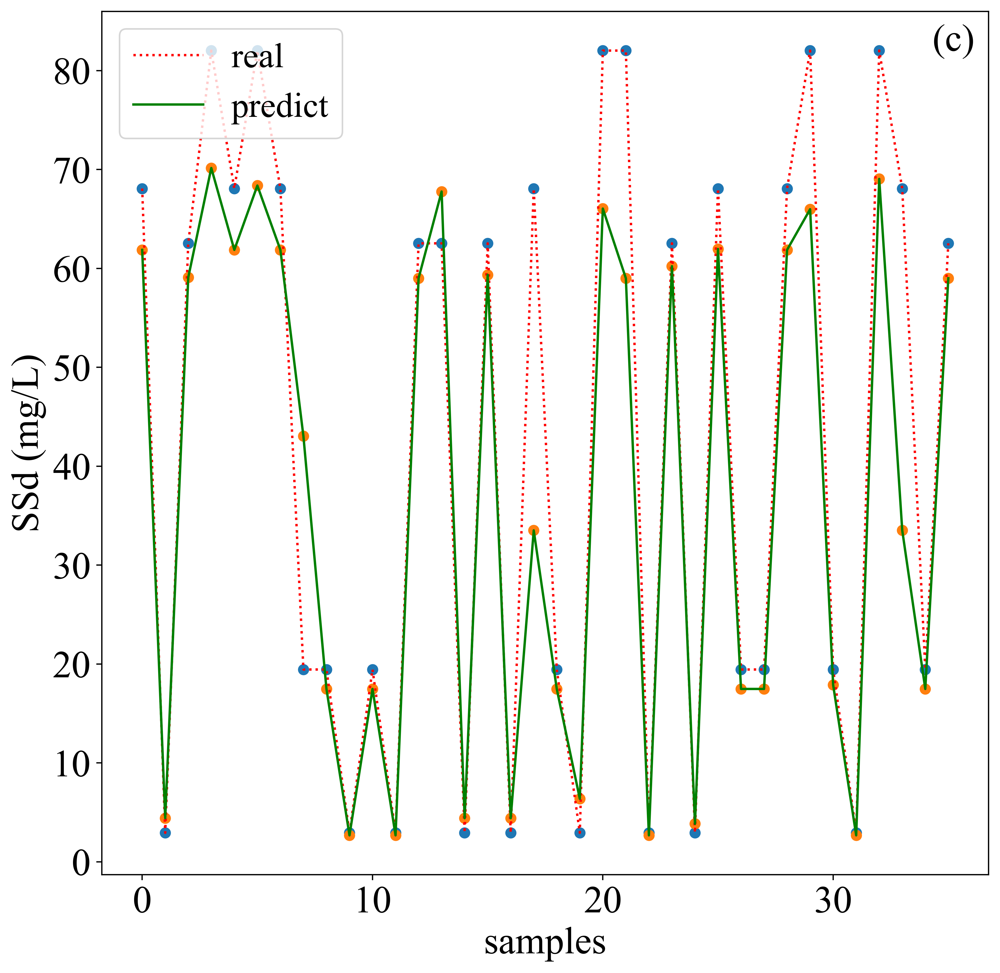

In [46]:
train_xgb(train_x,train_y,test_x,test_y,learning_rate=0.9,reg_alpha=0.1,reg_lambda=0.05,max_depth=10,task='regression',regression_label='SSd',poisition='(c)')

r2: 0.9393114450050077
mse: 5.578301030673911


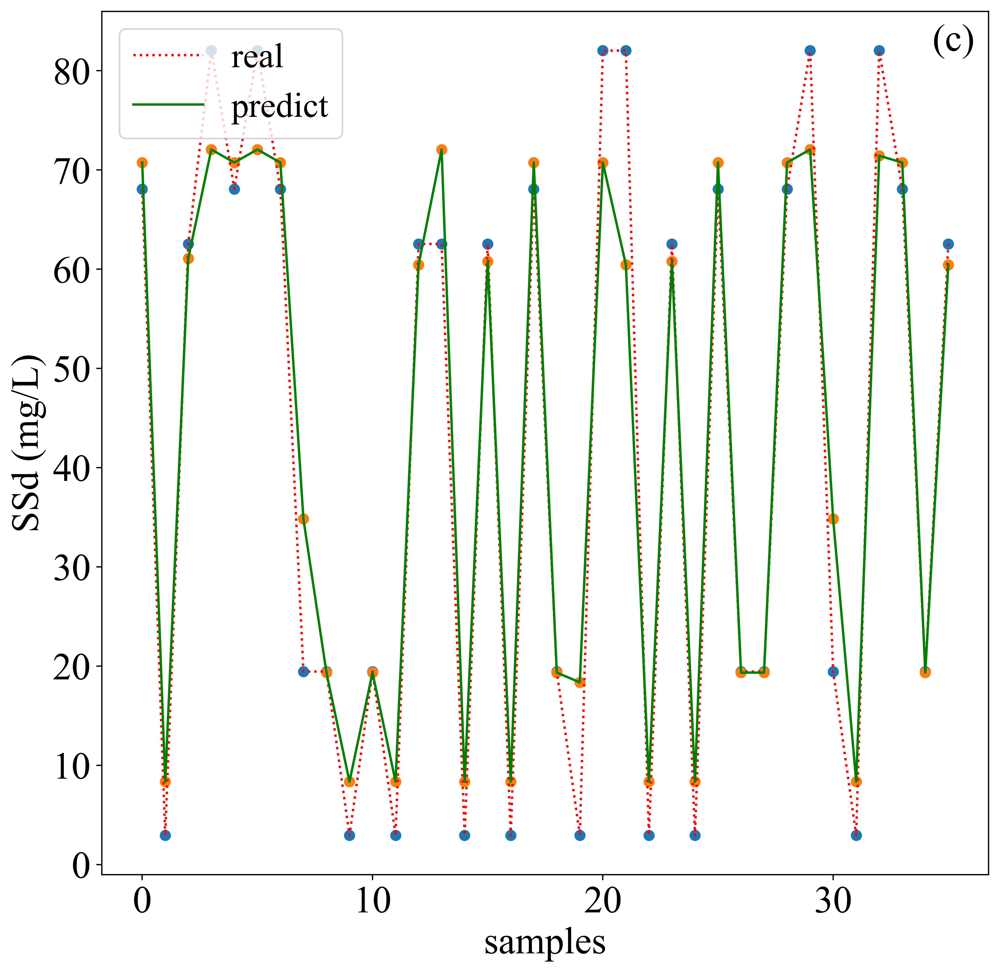

In [47]:
train_lgb(train_x,train_y,test_x,test_y,boosting_type='gbdt',learning_rate=0.9,max_depth=6,lambda_l1=100,lambda_l2=200,task='regression',regression_label='SSd',poisition='(c)')